In [2]:
# Import libraries

import warnings
from datetime import datetime
from dateutil.relativedelta import relativedelta

# Suppress unnecessary Shapely warning
warnings.filterwarnings('ignore',
                        '.*Shapely GEOS version.*')

import pandas as pd
from functools import reduce
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from matplotlib.gridspec import GridSpec


# Set up Pandas defaults
pd.options.display.float_format = '{:.4f}'.format
pd.set_option("display.max_columns", None)

# Import Zillow and MSA cleaning functions
from helper_functions.msa_zip_cleaning import *
from helper_functions.census_functions import *



In [4]:
### Read in state and MSA codes

# Read in state FIPS codes
state_fips = pd.read_csv(
    "datasets/helper_datasets/state_FIPS_codes.csv",
    dtype={'state_code':str}
)

# Read in MSA state codes
msa_state_fips = pd.read_csv(
    "datasets/helper_datasets/msa_and_state_codes.csv",
    dtype={'FIPS State Code':str, 'CBSA Code':str}
)

# Get only necessary columns
msa_state_fips = msa_state_fips[['CBSA Code','CBSA Title','FIPS State Code']]

# Rename column
msa_state_fips.rename(columns={'FIPS State Code':'state_code'}, inplace=True)

msa_state_fips.head(3)

,CBSA Code,CBSA Title,state_code
0,10180,"Abilene, TX",48
1,10380,"Aguadilla-Isabela, PR",72
2,10420,"Akron, OH",39


### Define Helper Functions

In [5]:
### Helper function for Census Datasets
def prep_census_datasets(dataframe, msa_state_fips=msa_state_fips):
    """
    This function preps the census datasets into
    the same format as the BLS job datasets
    for future city comparisons using both
    Census and BLS datasets.
    """
    # Make copy
    df = dataframe.copy()
    
    # Turn into tidy datetime
    df = turn_df_into_datetime(df)

    # Add MSA state code
    df = df.merge(msa_state_fips, 
                    how='left', 
                    left_on=['msa_name','msa_code'],
                    right_on=['CBSA Title','CBSA Code'])

    # Drop unnecessary columns
    df.drop(columns=['CBSA Title','CBSA Code'], inplace=True)

    # Replace NECTA Division
    df['msa_name'] = df['msa_name'].apply(lambda x: x.replace(" NECTA Division",""))
    df['msa_name'] = df['msa_name'].apply(lambda x: x.replace(" NECTA",""))
    
    return df

### Analyze MSA Growth

In [3]:
# Read in most recent job data
jobs = pd.read_csv('datasets/bls/smoothed/most_recent_bls_covid_smoothed.csv',
                   dtype={'msa_code':str, 'state_code':str})

# Make sure the date column is in datetime format
jobs['date'] = pd.to_datetime(jobs['date'])

# Replace NECTA Division
jobs['msa_name'] = jobs['msa_name'].apply(lambda x: x.replace(" NECTA Division",""))
jobs['msa_name'] = jobs['msa_name'].apply(lambda x: x.replace(" NECTA",""))

jobs

,msa_code,msa_name,state_code,year,month,date,value,series_id,state,city,interpolated
0,10180,"Abilene, TX",48,2024,March,2024-03-01,77400.00,SMS48101800000000001,TX,Abilene,77400.00
1,10180,"Abilene, TX",48,2024,February,2024-02-01,77300.00,SMS48101800000000001,TX,Abilene,77300.00
2,10180,"Abilene, TX",48,2024,January,2024-01-01,77200.00,SMS48101800000000001,TX,Abilene,77200.00
3,10180,"Abilene, TX",48,2023,December,2023-12-01,77100.00,SMS48101800000000001,TX,Abilene,77100.00
4,10180,"Abilene, TX",48,2023,November,2023-11-01,77400.00,SMS48101800000000001,TX,Abilene,77400.00
...,...,...,...,...,...,...,...,...,...,...,...
43285,49740,"Yuma, AZ",04,2015,May,2015-05-01,53100.00,SMS04497400000000001,AZ,Yuma,53100.00
43286,49740,"Yuma, AZ",04,2015,April,2015-04-01,53000.00,SMS04497400000000001,AZ,Yuma,53000.00
43287,49740,"Yuma, AZ",04,2015,March,2015-03-01,52800.00,SMS04497400000000001,AZ,Yuma,52800.00
43288,49740,"Yuma, AZ",04,2015,February,2015-02-01,53000.00,SMS04497400000000001,AZ,Yuma,53000.00


### Read in: 

1. Median Rent
2. Median Price
3. Rent-to-Price ratio per MSA

In [10]:
# Read in median rent
median_rent = pd.read_csv(
    "datasets/cleaned_census_api_files/msa_data/median_rent_msa.csv",
    dtype={'msa_code':str}
)

display(median_rent.head(2))

# Run prep function to get into correct format
median_rent = prep_census_datasets(median_rent)

median_rent.head(3)


,msa_name,msa_code,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
0,"Abilene, TX",10180,554.000000,515.000000,572.000000,549.000000,613.000000,598.000000,653.000000,653.000000,722.000000,692.000000,734.500000,777.000000,869.000000
1,"Aguadilla-Isabela, PR",10380,292.000000,299.000000,316.000000,323.000000,310.000000,298.000000,316.000000,327.000000,336.000000,308.000000,322.500000,337.000000,361.000000


,msa_name,msa_code,year,value,date,state_code
0,"Abilene, TX",10180,2010,554.000000,2010-01-01,48
1,"Abilene, TX",10180,2011,515.000000,2011-01-01,48
2,"Abilene, TX",10180,2012,572.000000,2012-01-01,48


In [11]:
# Read in median price
median_price = pd.read_csv(
    "datasets/cleaned_census_api_files/msa_data/median_price_msa.csv",
    dtype={'msa_code':str}
)

# Run prep function to get into correct format
median_price = prep_census_datasets(median_price)

median_price.head(3)

,msa_name,msa_code,year,value,date,state_code
0,"Abilene, TX",10180,2010,90900.000000,2010-01-01,48
1,"Abilene, TX",10180,2011,81900.000000,2011-01-01,48
2,"Abilene, TX",10180,2012,94600.000000,2012-01-01,48


In [12]:
# Read in rent_to_price
rent_to_price = pd.read_csv(
    "datasets/cleaned_census_api_files/msa_data/rent_price_ratio_msa.csv",
    dtype={'msa_code':str}
)

# Run prep function to get into correct format
rent_to_price = prep_census_datasets(rent_to_price)

rent_to_price.head(3)

,msa_name,msa_code,year,value,date,state_code
0,"Abilene, TX",10180,2010,0.006095,2010-01-01,48
1,"Abilene, TX",10180,2011,0.006288,2011-01-01,48
2,"Abilene, TX",10180,2012,0.006047,2012-01-01,48


In [13]:
# Read in median income
median_income = pd.read_csv(
    "datasets/cleaned_census_api_files/msa_data/median_income_msa.csv",
    dtype={'msa_code':str}
)

# Run prep function to get into correct format
median_income = prep_census_datasets(median_income)

median_income.head(3)

,msa_name,msa_code,year,value,date,state_code
0,"Abilene, TX",10180,2010,40630.000000,2010-01-01,48
1,"Abilene, TX",10180,2011,40659.000000,2011-01-01,48
2,"Abilene, TX",10180,2012,43407.000000,2012-01-01,48


### Define plotting function

In [4]:
# Loop through all cities, sort by coefficient, plot top 10
def plot_top_10_cities(
    ranked_cities,
    plot_jobs=False,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    using_zillow_data=False,
    plot_zillow_price=False,
    plot_zillow_rent=False,
    begin_year_1=2013,
    plot_all=False,
    column_to_use='value',
    plot_total_growth_trend=True
):
    """
    Plots the top cities for a given demographic. Top cities
    are chosen based on their trend. This function can also 
    find the top cities based on multiple datasets.
    
    Arguments
    ----------
        ranked_cities (DataFrame): A dataframe of cities
            already ranked by various demographics. The
            dataframe returned by the "make_ranking()"
            function is the ideal dataframe to pass
            to this function.
            
        plot_jobs (True/False): If Ture, plot jobs. Only one 
            demographic can be plotted at a time, so if you'd 
            like to plot a different demographic, this must 
            be set to False.
        
        plot_rent (True/False): If Ture, plot rent. Only one 
            demographic can be plotted at a time, so if you'd 
            like to plot a different demographic, this must 
            be set to False.
        
        plot_income (True/False): If Ture, plot income. Only one 
            demographic can be plotted at a time, so if you'd 
            like to plot a different demographic, this must 
            be set to False.
        
        plot_price (True/False): If Ture, plot price. Only one 
            demographic can be plotted at a time, so if you'd 
            like to plot a different demographic, this must 
            be set to False.
        
        plot_units (True/False): If Ture, plot units. Only one 
            demographic can be plotted at a time, so if you'd 
            like to plot a different demographic, this must 
            be set to False.
        
        plot_rent_to_price (True/False): If Ture, plot rent-ro-price
            ratio. Only one demographic can be plotted at a time, 
            so if you'd like to plot a different demographic, 
            this must be set to False.
        
        plot_jobs_per_unit (True/False): If Ture, plot jobs-per-unit. 
            Only one demographic can be plotted at a time, so if 
            you'd like to plot a different demographic, this must 
            be set to False.
            
        begin_year_1 (int): The year you'd like the
            analysis to start.
            
        plot_all (True/False): True if you want to plot every
            city in the dataframe (slow). False if you only want
            to plot the top 5 (fast).
    
    Returns
    ----------
        coef_df (DataFrame): A dataframe with the rankings
            of each city, from "best to worst."
    
    """
    # Make a copy of the ranked cities
    ranked = ranked_cities.copy()
    
    # If not plotting all cities (and just top 10),
    # keep only the top 10 cities in the dataframe
    if not plot_all:
        ranked = ranked.head(10)
    
    ### Call in the dataset we will be graphing from
    
    # If plotting job growth
    if plot_jobs:
        
        # Set demographic title for graphs
        demographic_1="Job"
        
        # Read in most recent job data
        dataframe_1 = pd.read_csv('datasets/bls/smoothed/most_recent_bls_covid_smoothed.csv',
                           dtype={'msa_code':str, 'state_code':str})

        # Make sure the date column is in datetime format
        dataframe_1['date'] = pd.to_datetime(dataframe_1['date'])
        
        if using_zillow_data:
            # Clean the BLS msa names
            dataframe_1 = clean_BLS_msa_names(dataframe_1)

        # Replace NECTA Division
        dataframe_1['msa_name'] = dataframe_1['msa_name'].apply(lambda x: x.replace(" NECTA Division",""))
        dataframe_1['msa_name'] = dataframe_1['msa_name'].apply(lambda x: x.replace(" NECTA",""))
    
    # If plotting rent growth
    elif plot_rent:
        
        # Set demographic title for graphs
        demographic_1="Median Rent"
        
        # Read in data
        dataframe_1 = pd.read_csv(
            "datasets/cleaned_census_api_files/msa_data/median_rent_msa.csv",
            dtype={'msa_code':str})

        # Run prep function to get into correct format
        dataframe_1 = prep_census_datasets(dataframe_1)
        
    # If plotting income growth
    elif plot_income:
        
        # Set demographic title for graphs
        demographic_1="Median Income"
        
        # Read in data
        dataframe_1 = pd.read_csv(
            "datasets/cleaned_census_api_files/msa_data/median_income_msa.csv",
            dtype={'msa_code':str})

        # Run prep function to get into correct format
        dataframe_1 = prep_census_datasets(dataframe_1)
        
    # If plotting price growth
    elif plot_price:
        
        # Set demographic title for graphs
        demographic_1="Median Price"
        
        # Read in data
        dataframe_1 = pd.read_csv(
            "datasets/cleaned_census_api_files/msa_data/median_price_msa.csv",
            dtype={'msa_code':str})

        # Run prep function to get into correct format
        dataframe_1 = prep_census_datasets(dataframe_1)
        
    elif plot_zillow_price:
        
        # Set demographic title for graphs
        demographic_1="Median Price (Zillow)"
        
        # Read in data
        dataframe_1 = clean_zillow_dataset(
            pd.read_csv(
                'datasets/zillow/zillow_median_price/Metro_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv'
            )
        )
        
    elif plot_zillow_rent:
        
        # Set demographic title for graphs
        demographic_1="Median Rent (Zillow)"
        
        # Read in data
        dataframe_1 = clean_zillow_dataset(
            pd.read_csv(
                'datasets/zillow/zillow_rental/Metro_zori_uc_sfrcondomfr_sm_sa_month.csv'
            )
        )
        
        
    # If plotting unit growth
    elif plot_units:
        
        # Set demographic title for graphs
        demographic_1="Total Units"
        
        # Read in data
        dataframe_1 = pd.read_csv(
            "datasets/cleaned_census_api_files/msa_data/total_units_msa.csv",
            dtype={'msa_code':str})

        # Run prep function to get into correct format
        dataframe_1 = prep_census_datasets(dataframe_1)
        
    # If plotting rent-to-price
    elif plot_rent_to_price:
        
        # Set demographic title for graphs
        demographic_1="Rent-to-Price"
        
        # Read in data
        dataframe_1 = pd.read_csv(
            "datasets/cleaned_census_api_files/msa_data/rent_price_ratio_msa.csv",
            dtype={'msa_code':str})

        # Run prep function to get into correct format
        dataframe_1 = prep_census_datasets(dataframe_1)
        
    # If plotting jobs-per-unit
    elif plot_jobs_per_unit:
        
        # Set demographic title for graphs
        demographic_1="Jobs per Unit"
        
        # Read in data
        dataframe_1 = pd.read_csv(
            "datasets/cleaned_census_api_files/msa_data/jobs_per_unit_msa.csv",
            dtype={'msa_code':str})

        # Run prep function to get into correct format
        dataframe_1 = prep_census_datasets(dataframe_1)
        
    # Otherwise, print error statement
    else:
        print("Please specify a demographic to plot by setting it to True, and leaving the others set to False.")
        raise Exception("SPECIFY A DEMOGRAPHIC TO PLOT.")
    
    # Make copy
    main_df = dataframe_1.copy()
            
    # Create main variable to use for the rest of the script
    column = column_to_use

    # Create dictionary to store filtered dataframes
    filtered_dict = {}

    # Set y_lim list to find max and min
    y_lim_list_trend = []
    y_min_list_trend = [0]
    y_lim_list_pct = []
    y_min_list_pct = [0]
    
    # Loop through all cities in the ranked dataframe
    for city in ranked['msa_name'].dropna().unique():

        # Isolate just that city
        df = main_df[main_df['msa_name']==city].copy()
                
        # Sort by date
        df = df.sort_values('date')
                        
        # Create difference column
        df['value_change'] = df[column].diff()
        
        # Create pct_change column
        df['percent_change'] = df[column].pct_change()
                
        # Filter by beginning year
        df = df[df['year']>=begin_year_1].reset_index(drop=True)
                
        # If an MSA's most recent year is after the beginning
        # year, remove it from the graphs. For example, if we want to
        # view the growth of all cities since 2016, but Prescott Valley
        # only has data starting at 2019, this may skew the data.
        if df['year'].iloc[0] != begin_year_1:
            print(f"Dropping {city}, it's dataframe has a smaller window.")
            continue
                
        # Remove NaN values
        df = df[df['percent_change'].notna()]
        
        # Isolate date and value columns
        df = df[[
            'date', column, 'value_change',
            'percent_change']].reset_index(drop=True)
        
        # Add this dataframe's y_lim to list
        y_lim_list_trend.append(df[column].max())
        y_min_list_trend.append(df[column].min())
        y_lim_list_pct.append(df['percent_change'].max())
        y_min_list_pct.append(df['percent_change'].min())
        
        # get next months's datetime
        next_year = df['date'].iloc[-1] + relativedelta(months=1)
        
        # Create ordinal column
        df['ordinal_date'] = df['date'].map(datetime.toordinal)
        
        # Run linear regression and get the trend's coefficient
        coef_value, intercept_value = run_lr(df, column=column)
        coef_pct, intercept_pct = run_lr(df, column='percent_change')
        
        # Create next year's date
        df.loc[len(df.index)] = [
            next_year, np.nan, np.nan, 
            np.nan, datetime.toordinal(next_year)]
        
        # Create averages column
        the_average_pct = df['percent_change'].mean()
        df['average_pct'] = the_average_pct
        the_average_value = df['value_change'].mean()
        df['average_value'] = the_average_value

        # Fill in with linear regression values.
        # Also add highest trend value to lim_list.
        df['value_trend'] = df['ordinal_date']*coef_value + intercept_value
        df['percent_change_trend'] = df['ordinal_date']*coef_pct + intercept_pct

        # Also add highest trend value to lim_list
        y_lim_list_trend.append(df['value_trend'].max())
        y_lim_list_pct.append(df['percent_change_trend'].max())

        # Get the y_lim
        y_lim_trend = max(y_lim_list_trend) * 1.1
        y_min_trend = min(y_min_list_trend)
        y_lim_pct = max(y_lim_list_pct) * 1.1
        y_min_pct = min(y_min_list_pct)
            
        # Save filtered data to dictionary
        filtered_dict[city] = df
    
    # Loop through each city in the ranked df
    for city_name in ranked['msa_name']:

        # Get the job data
        df = filtered_dict[city_name]    
            
        # Make a grid to plot 2 graphs on
        fig = plt.figure(figsize=(12,3), dpi=300)
        gs = GridSpec(nrows=1, ncols=2)
        ax1 = fig.add_subplot(gs[0,0])
        ax2 = fig.add_subplot(gs[0,1])
        ax_list = [ax1, ax2]
        
        # Set grid
        plt.style.use('seaborn-whitegrid')

        # Set title
        fig.suptitle(f"{city_name}\n\n\n", 
             fontweight="bold")

        # Plot first graph
        ax1 = df.plot(x='date',y=column, ax=ax1)
        if plot_total_growth_trend:
            ax1 = df.plot(x='date',y='value_trend', ax=ax1, linestyle="--")

        # Plot second graph
        ax2 = df.plot(x='date',y='percent_change', ax=ax2)
        ax2 = df.plot(x='date',y='percent_change_trend', ax=ax2, linestyle="--")

        # Second graph's zero line
        df['zero'] = 0
        ax2 = df.plot(x='date', y='zero', ax=ax2, color="grey")

        # Also plot the average line
        ax2 = df.plot(x='date', y='average_pct', 
                      ax=ax2, color="black", linestyle="-")

        # Set title's for both graphs
        ax1.set_title(f"{demographic_1} Growth")
        ax2.set_title(f"Percent Change in {demographic_1}")

        # Set y lims and y ticks
        ax1.set_ylim([y_min_trend, y_lim_trend])
        ax2.set_ylim([y_min_pct, y_lim_pct])

        # Set y limits
        y_tick_list_trend = [
            y_lim_trend*0.25, y_lim_trend*0.5, 
            y_lim_trend*0.75, y_lim_trend]
        y_tick_list_pct = [
            y_min_pct, y_min_pct*0.5, 0, 
            y_lim_pct*0.5, y_lim_pct]

        # Set y_ticks
        ax1.yaxis.set_major_locator(
            mticker.FixedLocator(y_tick_list_trend))
        ax2.yaxis.set_major_locator(
            mticker.FixedLocator(y_tick_list_pct))

        # Set y-tick labels
        ax1.set_yticklabels(
            ['{:,}'.format(round(float(x), 3)) for x in y_tick_list_trend])
        ax2.set_yticklabels(
            ['{:,}'.format(round(float(x), 3)) for x in y_tick_list_pct])
        
        # Give suptitle more room
        fig.subplots_adjust(top=0.85)

        # Create folder to save graphs into
        create_folder("graphs")
        create_folder("graphs/msa_graphs")
        create_folder(f"graphs/msa_graphs/{city_name}")

        # Create filepath to save graph to
        save_filepath = f"graphs/msa_graphs/{city_name}/{demographic_1} Growth.png"

        # Save the graphs
        plt.savefig(save_filepath)
        
        # Show plot
        if not plot_all:
            plt.show()
        
        # Clear plot
        plt.close("all")




### Define Ranking Function

In [8]:
### MAKE FUNCTION THAT MAKES A TOTAL RANK 
### BASED ON MULTIPLE DEMOGRAPHICS

def make_ranking(
    df_dict,
    max_price=False,
    min_rent_to_price=False,
    use_total_trend=True,
    use_average_percent=True,
    use_pct_trend=False,
    total_trend_weight_dict={},
    average_percent_weight_dict={},
    plot_graphs=False
):
    """
    This function ranks the invest-ability of every
    city based on the demographics passed. It
    analyzes the total average growth per year, as 
    well as the relative average growth per year
    (measured as the average percent growth per year).
    
    Arguments
    -----------
        df_dict (dict): A dictionary to be used if you
            want to combine multiple dataframes for analysis
            and plotting. If using this, the key should be
            a string with the demographic name, and the value
            should be a list containing the dataframe in position
            0, and the beginning year in position 1. See below
            for two examples...
            
            Example 1, One Extra Dataframe
            {"Median Rent": [median_rent_df, 2013]}
            
            Example 2, Multiple Extra Dataframes
            {"Median Rent": [median_rent_df, 2013],
            "Population" : [population_df, 2013]}
            
        max_price (int): If you only want to measure and
            compare MSAs up to a certain median price,
            enter the max median price as an integer.
            
        min_rent_to_price (float): If you only want to measure and
            compare MSAs up to a certain rent-to-price ratio
            (based on median rent and median price values),
            enter the minimum rent-to-price ratio as a float.
            
        use_total_trend (True/False): Set to True if you'd like
            to include the total trend weights in the ranking
            of MSAs. Use False if not.
        
        use_average_percent (True/False): Set to True if you'd like
            to include the average percent weights in the ranking
            of MSAs. Use False if not.
        
        total_trend_weight_dict (dict): A dictionary to set the
            weights of each demo. For example, if you'd like to
            multiply the "Median Rent" weights by 2, giving a bigger
            weight to the "Median Rent" demographic, all you need
            is to make the key "Median Rent" set to a value of 2.
            This dictionary is specifically for total trend weights.
            See the example below.
            
            EXAMPLE...
            total_trend_weight_dict={
                "Jobs":1,
                "Median Rent":1}
        
        average_percent_weight_dict (dict): A dictionary to set the
            weights of each demo. For example, if you'd like to
            multiply the "Median Rent" weights by 2, giving a bigger
            weight to the "Median Rent" demographic, all you need
            is to make the key "Median Rent" set to a value of 2.
            This dictionary is specifically for average percent weights.
            See the example below.
            
            EXAMPLE...
            average_percent_weight_dict={
                "Jobs":3,
                "Median Rent":3}
                
        plot_graphs (True/False): If True, ask for user inputs
            and run the plot_top_10_cities() function.
            
    Returns
    -----------
        final_df (DataFrame): A dataframe with each city
            sorted by total rank.
    """
    # Make a list to add each dataframe to
    df_list = []
    
    # Rename all columns by appending the demo name,
    # except for the MSA name and date, which we will 
    # use as the key to merge all dataframes.
    for demo in df_dict:
        
        # Get dataframe
        df = df_dict[demo][0].copy()
        
        # Rename every column except for msa_name
        for col in df.columns:
            if (col != 'msa_name') & (col != 'date') & (col != "msa_code"):
                df.rename(
                    columns={col:f'{col}_{demo}'}, 
                    inplace=True)
                
        # Add dataframe to list
        df_list.append(df)
                
    # Merge all dataframes
    merged_df = reduce(lambda left, right: 
                       pd.merge(left, right, 
                                left_on=['msa_name','date','msa_code'], 
                                right_on=['msa_name','date','msa_code'],
                                suffixes=(None, "_y"),
                                how="outer"), df_list)
    
    # Only keep necessary columns
    for demo in df_dict:
        merged_df.drop(columns=[
            f"state_code_{demo}",
        ], inplace=True)
        
    # Loop through columns and clean out the rest
    for col in merged_df.columns:
        if ('month_' in col) | ('series_id_' in col):
            merged_df.drop(columns=[col], inplace=True)
    
    # Create new df to store coefficients
    coef_df = pd.DataFrame(
        data=None, columns=['msa_name','msa_code'])
    
    # Add columns for every demo
    for demo in df_dict:
        coef_df[f'trend_coef_{demo}'] = None
        coef_df[f'average_value_{demo}'] = None
        coef_df[f'pct_coef_{demo}'] = None
        coef_df[f'average_pct_{demo}'] = None
        
    # Make temporary coef_df to use later
    temp_coef_1 = coef_df.copy()
        
    # Create ordinal column
    merged_df['ordinal_date'] = merged_df['date'].map(datetime.toordinal)
    
    # Loop through all cities
    for city in merged_df['msa_name'].dropna().unique():

        # Isolate just that city
        df = merged_df[merged_df['msa_name']==city].copy()
        
        # Get msa code
        msa_code = df['msa_code'].iloc[0]
        
        # Sort by date
        df = df.sort_values('date')
        
        # Make duplicate
        temp_coef_2 = temp_coef_1.copy()
        
        # Set temp coef_df
        temp_coef_2.loc[len(temp_coef_2.index)] = np.nan
        temp_coef_2['msa_name'] = city
        temp_coef_2['msa_code'] = msa_code
        
        # Loop through each demo
        for demo in df_dict:
            
            # Test to see if there's data for the demo
            if df[df[f'year_{demo}'].notna()].shape[0] > 0:
                
                # Make copy
                df_temp = df.copy()
                
                # Get beginning year
                begin_year = df_dict[demo][1]
                
                # Filter by beginning year minus 1
                df_temp = df[df[f'year_{demo}']>=begin_year-1].reset_index(drop=True)
                        
                # Create difference column
                df_temp[f'value_change_{demo}'] = df_temp[f'value_{demo}'].diff()

                # Create pct_change column
                df_temp[f'percent_change_{demo}'] = df_temp[f'value_{demo}'].pct_change()

                # Filter by beginning year
                df_temp = df_temp[
                    df_temp[f'year_{demo}']>=begin_year].reset_index(drop=True)

                # If an MSA's most recent year is after the beginning
                # year, remove it from the graphs. For example, if we want to
                # view the growth of all cities since 2016, but Prescott Valley
                # only has data starting at 2019, this may skew the data.
                if df_temp[f'year_{demo}'].iloc[0] != begin_year:
                    continue

                # Remove NaN values
                df_temp = df_temp[df_temp[f'percent_change_{demo}'].notna()]

                # Run linear regression
                coef_value, intercept_value = run_lr(df_temp, column=f'value_{demo}')
                coef_pct, intercept_pct = run_lr(df_temp, column=f'percent_change_{demo}')

                # Create trend columns
                df_temp[f'value_trend_{demo}'] = df_temp['ordinal_date']*coef_value + intercept_value
                df_temp[f'percent_change_trend_{demo}'] = df_temp['ordinal_date']*coef_pct + intercept_pct

                # Create averages column
                the_average_pct = df_temp[f'percent_change_{demo}'].mean()
                df_temp[f'average_pct_{demo}'] = the_average_pct
                the_average_value = df_temp[f'value_change_{demo}'].mean()
                df_temp[f'average_value_{demo}'] = the_average_value
                
                # Update temp coef
                temp_coef_2[f'trend_coef_{demo}'] = coef_value
                temp_coef_2[f'average_value_{demo}'] = the_average_value
                temp_coef_2[f'pct_coef_{demo}'] = coef_pct
                temp_coef_2[f'average_pct_{demo}'] = the_average_pct
            
        # Append temp coef to dataframe
        coef_df = pd.concat([coef_df, temp_coef_2])
            
    # Drop duplicates
    coef_df = coef_df.drop_duplicates().reset_index(drop=True)
    
    # Drop MSAs that have missing values (they will have missing
    # values if we couldn't join Census MSAs with BLS MSAs which
    # only occurs for a few specific MSAs)
    bad_msa = set()
    
    for demo in df_dict:
        
        # Filter by nulls
        coef_temp = coef_df[coef_df[f'trend_coef_{demo}'].isnull()]
        
        # Get list of MSAs
        bad_msa.update(coef_temp['msa_name'].unique())
        
        # Filter by nulls
        coef_temp = coef_df[coef_df[f'pct_coef_{demo}'].isnull()]
        
        # Get list of MSAs
        bad_msa.update(coef_temp['msa_name'].unique())
        
    # Remove these cities Print helpful message
    if len(bad_msa) > 0:
        
        # Remove cities in bad_msa
        coef_df = coef_df[~coef_df['msa_name'].isin(bad_msa)].reset_index(drop=True)
        
    # Create the rankings for each demographic
    for demo in df_dict:
        
        # Calculate rankings for both, then sort by the total
        # ranking. For example, if a city has the highest average
        # percent change, it will get a ranking of "1" for average_pct,
        # and if it has the 8th highest trend coefficient, it will
        # get a ranking of "8" for trend_coef. When we add those two
        # rankings together, the city will have a total ranking
        # of "9". In this case, the lower the ranking, the better,
        # and we will sort total rankings from lowest to highest.
        
        # Normalize total trend column
        coef_df[f'normalized_trend_coef_{demo}'] = normalize_column(
            coef_df[f'trend_coef_{demo}'], min_max_standardized=True)
        
        # Normalize pct trend column
        coef_df[f'normalized_pct_coef_{demo}'] = normalize_column(
            coef_df[f'pct_coef_{demo}'], min_max_standardized=True)
        
        # Normalize avg pct column
        coef_df[f'normalized_average_pct_{demo}'] = normalize_column(
            coef_df[f'average_pct_{demo}'], min_max_standardized=True)
        
        # Check to see if there are weights, and if not,
        # set each weight to 1
        if demo in total_trend_weight_dict.keys():
            trend_weight = total_trend_weight_dict[demo]
        else:
            trend_weight = 1
            
        # Check pct weight dict
        if demo in average_percent_weight_dict.keys():
            pct_weight = average_percent_weight_dict[demo]
        else:
            pct_weight = 1
            
        # Re-adjust weights based on whether we are using
        # only total trend, only percent, or both. As an example, 
        # if we aren't using percent, we set the weight to 0, that
        # way the percent weight isn't used when totalling the
        # demographic's weight.
        if use_total_trend == False:
            trend_weight = 0
        if use_average_percent == False:
            pct_weight = 0
            
        
        ### Create weights
        
        # If we want to rank based on % change trend
        if use_pct_trend:
            coef_df[f'{demo}_weight'] = (
                (coef_df[f'normalized_trend_coef_{demo}'] * trend_weight) 
                + (coef_df[f'normalized_pct_coef_{demo}'] * pct_weight)
            )
            
        # Otherwise rank on average % growth
        else:
            coef_df[f'{demo}_weight'] = (
                (coef_df[f'normalized_trend_coef_{demo}'] * trend_weight) 
                + (coef_df[f'normalized_average_pct_{demo}'] * pct_weight)
            )

    # Make final total rank column by adding up
    # all demo total rankings
    coef_df['total_weight'] = 0
    for demo in df_dict:
        coef_df['total_weight'] += coef_df[f'{demo}_weight']

    # Sort by total weight, highest to lowest
    final_df = coef_df.sort_values(
        'total_weight', ascending=False).reset_index(drop=True)
    
    # Merge median rent, price, and income to final df
    for demo in ["median_rent","median_price",
                 "median_income","rent_price_ratio",
                 "total_units"]:
        
        # Call in demographic dataset
        demo_df = pd.read_csv(
            f"datasets/cleaned_census_api_files/msa_data/{demo}_msa.csv",
            dtype={'msa_code':str}
        )

        # Run prep function to get into correct format
        demo_df = prep_census_datasets(demo_df)

        # Get most recent year for median price
        recent_year = demo_df['year'].max()

        # Filter by recent_year
        recent_year_df = demo_df[demo_df['year']==recent_year].copy()        
        
        # Only keep certain columns
        recent_year_df = recent_year_df[['msa_name','value']]
        
        # Rename column
        recent_year_df.rename(columns={'value':f'{demo}'}, inplace=True)
        
        # Merge to final_df
        final_df = final_df.merge(recent_year_df, how='left', on='msa_name')
        
    # Merge jobs and create jobs-per-unit
    jobs = pd.read_csv('datasets/bls/raw/most_recent_bls_data.csv',
                   dtype={'msa_code':str, 'state_code':str})

    # Make sure the date column is in datetime format
    jobs['date'] = pd.to_datetime(jobs['date'])

    # Replace NECTA Division
    jobs['msa_name'] = jobs['msa_name'].apply(lambda x: x.replace(" NECTA Division",""))
    jobs['msa_name'] = jobs['msa_name'].apply(lambda x: x.replace(" NECTA",""))

    # Get most recent job date
    recent_date = jobs['date'].max()

    # Filter jobs so it's the most recent date
    new_jobs = jobs[jobs['date']==recent_date].copy().reset_index(drop=True)

    # Only keep certain columns
    new_jobs = new_jobs[['msa_name','value']]
    
    # Rename column
    new_jobs.rename(columns={'value':f'jobs'}, inplace=True)

    # Merge to final_df
    final_df = final_df.merge(new_jobs, how='left', on='msa_name')
    
    # Create jobs-per-units column
    final_df['jobs_per_unit'] = final_df['jobs']/final_df['total_units']
    
    # If max price, filter it
    if max_price:
        final_df = final_df[final_df['median_price']<=max_price].reset_index(drop=True)
        
    # If min rent-price ratio, filter
    if min_rent_to_price:
        final_df = final_df[final_df['rent_price_ratio']>=min_rent_to_price].reset_index(drop=True)
        
    ### Save ranking
    
    # Make folder to save coef_df to
    trend_folder = "datasets/cleaned_census_api_files/msa_data/msa_rankings/"
    create_folder(trend_folder)
    
    # Create variable string for file naming
    var_string = ""
    for demo in df_dict:
        var_string += demo
        var_string += "_"
    var_string += "rankings.csv"
        
#     var_string = "all_city_demographic_trends.csv"
        
    # Save coef_df
    final_df.to_csv(f"{trend_folder}/{var_string}", index=False)
    
            
    return final_df



## Using Zillow Datasets

In [5]:
zillow_price = clean_zillow_dataset(
    pd.read_csv(
        'datasets/zillow/zillow_median_price/Metro_zhvi_uc_sfrcondo_tier_0.33_0.67_sm_sa_month.csv'
    )
)

zillow_price

,msa_name,date,value,year
0,United States,2000-01-01,122659.35,2000
1,United States,2000-02-01,122875.15,2000
2,United States,2000-03-01,123142.77,2000
3,United States,2000-04-01,123716.76,2000
4,United States,2000-05-01,124377.36,2000
...,...,...,...,...
212069,"Lamesa, TX",2023-12-01,87580.30,2023
212070,"Lamesa, TX",2024-01-01,86856.16,2024
212071,"Lamesa, TX",2024-02-01,85769.13,2024
212072,"Lamesa, TX",2024-03-01,85820.97,2024


In [6]:
zillow_rent = clean_zillow_dataset(
    pd.read_csv(
        'datasets/zillow/zillow_rental/Metro_zori_uc_sfrcondomfr_sm_sa_month.csv'
    )
)

zillow_rent

,msa_name,date,value,year
0,United States,2015-01-01,1226.94,2015
1,United States,2015-02-01,1232.48,2015
2,United States,2015-03-01,1238.28,2015
3,United States,2015-04-01,1243.30,2015
4,United States,2015-05-01,1247.67,2015
...,...,...,...,...
35884,"Portales, NM",2024-01-01,758.64,2024
35885,"Portales, NM",2024-02-01,764.89,2024
35886,"Portales, NM",2024-03-01,763.06,2024
35887,"Fairfield, IA",2024-02-01,695.24,2024


In [7]:
# Add Property Tax to dataframe
def add_prop_tax_and_insurance(dataframe):
    
    df = dataframe.copy()
    
    ## Read in property tax dataset
    proptax = pd.read_csv('datasets/helper_datasets/property-taxes-by-state-2024.csv')

    # Read in abbreviations
    state_abbr = pd.read_csv('datasets/helper_datasets/states_abbr.csv')
    state_abbr = state_abbr.rename(columns={'State':'state'})

    # Join by state name
    proptax = proptax.merge(state_abbr, on='state', how='inner')
    
    # Now create state column in main df
    df['state'] = df['msa_name'].str.split(", ").str[1]
    
    # Read in insurance
    insurance = pd.read_csv('datasets/helper_datasets/state_avg_insurance.csv')
    
    # Join by state abbr
    df = df.merge(insurance, on='state')
    
    # Now join based on state abbr
    proptax = proptax.drop(columns={'state'})
    proptax.rename(columns={'Abbreviation':'state',
                           'PropertyTaxRate':'prop_tax'}, inplace=True)
    df = df.merge(proptax, on='state')
    df.drop(columns=['state'], inplace=True)
    
    return df
    

### Read in Interpolated (Smoothed) Jobs Dataset

In [8]:
# Read in the smoothed job dataset
jobs_smooth = pd.read_csv(
    'datasets/bls/smoothed/most_recent_bls_covid_smoothed.csv')

jobs_smooth['date'] = pd.to_datetime(jobs_smooth['date'])

# Keep only necessary columns
jobs_smooth = jobs_smooth[['msa_name','date','year','value','interpolated']]

jobs_smooth

,msa_name,date,year,value,interpolated
0,"Abilene, TX",2024-03-01,2024,77400.00,77400.00
1,"Abilene, TX",2024-02-01,2024,77300.00,77300.00
2,"Abilene, TX",2024-01-01,2024,77200.00,77200.00
3,"Abilene, TX",2023-12-01,2023,77100.00,77100.00
4,"Abilene, TX",2023-11-01,2023,77400.00,77400.00
...,...,...,...,...,...
43285,"Yuma, AZ",2015-05-01,2015,53100.00,53100.00
43286,"Yuma, AZ",2015-04-01,2015,53000.00,53000.00
43287,"Yuma, AZ",2015-03-01,2015,52800.00,52800.00
43288,"Yuma, AZ",2015-02-01,2015,53000.00,53000.00


In [13]:
### Now we will remove MSAs with less than 250,000 jobs

# Create a dictionary that matches each MSA 
# to its maximum job number
msa_names = jobs_smooth['msa_name'].unique()
msa_max_dict = {}
for msa in msa_names:
    max_jobs = jobs_smooth[jobs_smooth['msa_name']==msa]['value'].max()
    msa_max_dict[msa] = max_jobs
    
# Get this dictionary into a dataframe
max_jobs = pd.DataFrame.from_dict(
    msa_max_dict, orient='index', columns=['max']
).reset_index().rename(columns={'index':'msa_name'})

# Filter for only bigger towns, where number of jobs is over 250,000
job_limit = max_jobs[max_jobs['max']>=250_000].copy()

# Get the msa names
job_limit_msa_names = job_limit['msa_name'].unique()

# Filter to only keep the MSAs with more than 250,000 jobs
mask = jobs_smooth['msa_name'].isin(job_limit_msa_names)
jobs_250 = jobs_smooth[mask].reset_index(drop=True).copy()



jobs_250


,msa_name,date,year,value,interpolated
0,"Akron, OH",2024-03-01,2024,341000.00,341000.00
1,"Akron, OH",2024-02-01,2024,339600.00,339600.00
2,"Akron, OH",2024-01-01,2024,339800.00,339800.00
3,"Akron, OH",2023-12-01,2023,339800.00,339800.00
4,"Akron, OH",2023-11-01,2023,338600.00,338600.00
...,...,...,...,...,...
11650,"Worcester, MA",2015-05-01,2015,278000.00,278000.00
11651,"Worcester, MA",2015-04-01,2015,276600.00,276600.00
11652,"Worcester, MA",2015-03-01,2015,276200.00,276200.00
11653,"Worcester, MA",2015-02-01,2015,275300.00,275300.00


In [9]:
# Get mean insurance amount and mean prop taxes
insurance = pd.read_csv('datasets/helper_datasets/state_avg_insurance.csv')
avg_insurance = insurance['avg_insurance'].mean()
print("Average insurance:", avg_insurance)
median_insurance = insurance['avg_insurance'].median()
print("Median insurance:", median_insurance)
insurance_third_quantile = insurance['avg_insurance'].quantile(.75)

print("\n")

proptaxes = pd.read_csv('datasets/helper_datasets/property-taxes-by-state-2024.csv')
avg_proptaxes = proptaxes['PropertyTaxRate'].mean()
print("Average property tax:", avg_proptaxes)
median_proptaxes = proptaxes['PropertyTaxRate'].median()
print("Median property tax:", median_proptaxes)
proptaxes_third_quantile = proptaxes['PropertyTaxRate'].quantile(.75)


Average insurance: 4105.152173913043
Median insurance: 4178.5


Average property tax: 0.01106078431372549
Median property tax: 0.0092


In [10]:
### MAKE FUNCTION THAT MAKES A TOTAL RANK 
### BASED ON MULTIPLE DEMOGRAPHICS from Zillow and BLS datasets

def make_zillow_ranking(
    df_dict,
    all_df_dict={
        "Jobs":[jobs_smooth],
        "Median Rent":[zillow_rent],
        "Median Price":[zillow_price],
    },
    max_price=False,
    min_rent_to_price=False,
    use_total_trend=True,
    use_average_percent=True,
    use_pct_trend=False,
    total_trend_weight_dict={},
    average_percent_weight_dict={},
    plot_graphs=False,
    insurance_third_quantile=insurance_third_quantile,
    proptaxes_third_quantile=proptaxes_third_quantile,
    min_jobs=250_000
):
    """
    This function ranks the invest-ability of every
    city based on the demographics passed. It
    analyzes the total average growth per year, as 
    well as the relative average growth per year
    (measured as the average percent growth per year).
    
    Arguments
    -----------
        df_dict (dict): A dictionary to be used if you
            want to combine multiple dataframes for analysis
            and plotting. If using this, the key should be
            a string with the demographic name, and the value
            should be a list containing the dataframe in position
            0, and the beginning year in position 1. See below
            for two examples...
            
            Example 1, One Extra Dataframe
            {"Median Rent": [median_rent_df, 2013]}
            
            Example 2, Multiple Extra Dataframes
            {"Median Rent": [median_rent_df, 2013],
            "Population" : [population_df, 2013]}
            
        max_price (int): If you only want to measure and
            compare MSAs up to a certain median price,
            enter the max median price as an integer.
            
        min_rent_to_price (float): If you only want to measure and
            compare MSAs up to a certain rent-to-price ratio
            (based on median rent and median price values),
            enter the minimum rent-to-price ratio as a float.
            
        use_total_trend (True/False): Set to True if you'd like
            to include the total trend weights in the ranking
            of MSAs. Use False if not.
        
        use_average_percent (True/False): Set to True if you'd like
            to include the average percent weights in the ranking
            of MSAs. Use False if not.
        
        total_trend_weight_dict (dict): A dictionary to set the
            weights of each demo. For example, if you'd like to
            multiply the "Median Rent" weights by 2, giving a bigger
            weight to the "Median Rent" demographic, all you need
            is to make the key "Median Rent" set to a value of 2.
            This dictionary is specifically for total trend weights.
            See the example below.
            
            EXAMPLE...
            total_trend_weight_dict={
                "Jobs":1,
                "Median Rent":1}
        
        average_percent_weight_dict (dict): A dictionary to set the
            weights of each demo. For example, if you'd like to
            multiply the "Median Rent" weights by 2, giving a bigger
            weight to the "Median Rent" demographic, all you need
            is to make the key "Median Rent" set to a value of 2.
            This dictionary is specifically for average percent weights.
            See the example below.
            
            EXAMPLE...
            average_percent_weight_dict={
                "Jobs":3,
                "Median Rent":3}
                
        plot_graphs (True/False): If True, ask for user inputs
            and run the plot_top_10_cities() function.
            
    Returns
    -----------
        final_df (DataFrame): A dataframe with each city
            sorted by total rank.
    """
    # Make a list to add each dataframe to
    df_list = []
    
    # Rename all columns by appending the demo name,
    # except for the MSA name and date, which we will 
    # use as the key to merge all dataframes.
    for demo in df_dict:
        
        # Get dataframe
        df = df_dict[demo][0][['msa_name','date','value','year']].copy()
        
        # Rename every column except for msa_name
        for col in df.columns:
            if (col != 'msa_name') & (col != 'date'):
                df.rename(
                    columns={col:f'{col}_{demo}'}, 
                    inplace=True)
                
        # Add dataframe to list
        df_list.append(df)
                
    # Merge all dataframes
    merged_df = reduce(lambda left, right: 
                       pd.merge(left, right, 
                                left_on=['msa_name','date'], 
                                right_on=['msa_name','date'],
                                suffixes=(None, "_y"),
                                how="outer"), df_list)
            
    # Loop through columns and clean out the rest
    for col in merged_df.columns:
        if ('month_' in col) | ('series_id_' in col):
            merged_df.drop(columns=[col], inplace=True)
    
    # Create new df to store coefficients
    coef_df = pd.DataFrame(
        data=None, columns=['msa_name'])
    
    # Add columns for every demo
    for demo in df_dict:
        coef_df[f'trend_coef_{demo}'] = None
        coef_df[f'average_value_{demo}'] = None
        coef_df[f'pct_coef_{demo}'] = None
        coef_df[f'average_pct_{demo}'] = None
        
    # Make temporary coef_df to use later
    temp_coef_1 = coef_df.copy()
        
    # Create ordinal column
    merged_df['ordinal_date'] = merged_df['date'].map(datetime.toordinal)
    
    # Loop through all cities
    for city in merged_df['msa_name'].dropna().unique():

        # Isolate just that city
        df = merged_df[merged_df['msa_name']==city].copy()
        
        # Get msa code
#         msa_code = df['msa_code'].iloc[0]
        
        # Sort by date
        df = df.sort_values('date')
        
        # Make duplicate
        temp_coef_2 = temp_coef_1.copy()
        
        # Set temp coef_df
        temp_coef_2.loc[len(temp_coef_2.index)] = np.nan
        temp_coef_2['msa_name'] = city
#         temp_coef_2['msa_code'] = msa_code

        
        # Loop through each demo
        for demo in df_dict:
            
            # Test to see if there's data for the demo
            if df[df[f'year_{demo}'].notna()].shape[0] > 0:
                
                # Make copy
                df_temp = df.copy()

                # Get beginning year
                begin_year = df_dict[demo][1]

                # Filter by beginning year minus 1
                df_temp = df[df[f'year_{demo}']>=begin_year-1].reset_index(drop=True)

                # Create difference column
                df_temp[f'value_change_{demo}'] = df_temp[f'value_{demo}'].diff()

                # Create pct_change column
                df_temp[f'percent_change_{demo}'] = df_temp[f'value_{demo}'].pct_change()

                # Filter by beginning year
                df_temp = df_temp[
                    df_temp[f'year_{demo}']>=begin_year].reset_index(drop=True)

                # If an MSA's most recent year is after the beginning
                # year, remove it from the graphs. For example, if we want to
                # view the growth of all cities since 2016, but Prescott Valley
                # only has data starting at 2019, this may skew the data.
                if df_temp[f'year_{demo}'].iloc[0] != begin_year:
                    continue

                # Remove NaN values
                df_temp = df_temp[df_temp[f'percent_change_{demo}'].notna()]

                # Run linear regression
                coef_value, intercept_value = run_lr(df_temp, column=f'value_{demo}')
                coef_pct, intercept_pct = run_lr(df_temp, column=f'percent_change_{demo}')

                # Create trend columns
                df_temp[f'value_trend_{demo}'] = df_temp['ordinal_date']*coef_value + intercept_value
                df_temp[f'percent_change_trend_{demo}'] = df_temp['ordinal_date']*coef_pct + intercept_pct

                # Create averages column
                the_average_pct = df_temp[f'percent_change_{demo}'].mean()
                df_temp[f'average_pct_{demo}'] = the_average_pct
                the_average_value = df_temp[f'value_change_{demo}'].mean()
                df_temp[f'average_value_{demo}'] = the_average_value

                # Update temp coef
                temp_coef_2[f'trend_coef_{demo}'] = coef_value
                temp_coef_2[f'average_value_{demo}'] = the_average_value
                temp_coef_2[f'pct_coef_{demo}'] = coef_pct
                temp_coef_2[f'average_pct_{demo}'] = the_average_pct

        # Append temp coef to dataframe
        coef_df = pd.concat([coef_df, temp_coef_2])
            
    # Drop duplicates
    coef_df = coef_df.drop_duplicates().reset_index(drop=True)
    
    # Drop MSAs that have missing values (they will have missing
    # values if we couldn't join Census MSAs with BLS MSAs which
    # only occurs for a few specific MSAs)
    bad_msa = set()
    
    for demo in df_dict:
        
        # Filter by nulls
        coef_temp = coef_df[coef_df[f'trend_coef_{demo}'].isnull()]
        
        # Get list of MSAs
        bad_msa.update(coef_temp['msa_name'].unique())
        
        # Filter by nulls
        coef_temp = coef_df[coef_df[f'pct_coef_{demo}'].isnull()]
        
        # Get list of MSAs
        bad_msa.update(coef_temp['msa_name'].unique())
        
    # Remove these cities
    if len(bad_msa) > 0:
        
        # Remove cities in bad_msa
        coef_df = coef_df[~coef_df['msa_name'].isin(bad_msa)].reset_index(drop=True)
        
    # Create the rankings for each demographic
    for demo in df_dict:
        
        # Calculate rankings for both, then sort by the total
        # ranking. For example, if a city has the highest average
        # percent change, it will get a ranking of "1" for average_pct,
        # and if it has the 8th highest trend coefficient, it will
        # get a ranking of "8" for trend_coef. When we add those two
        # rankings together, the city will have a total ranking
        # of "9". In this case, the lower the ranking, the better,
        # and we will sort total rankings from lowest to highest.
        
        # Normalize total trend column
        coef_df[f'normalized_trend_coef_{demo}'] = normalize_column(
            coef_df[f'trend_coef_{demo}'], min_max_standardized=True)
        
        # Normalize pct trend column
        coef_df[f'normalized_pct_coef_{demo}'] = normalize_column(
            coef_df[f'pct_coef_{demo}'], min_max_standardized=True)
        
        # Normalize avg pct column
        coef_df[f'normalized_average_pct_{demo}'] = normalize_column(
            coef_df[f'average_pct_{demo}'], min_max_standardized=True)
        
        # Check to see if there are weights, and if not,
        # set each weight to 1
        if demo in total_trend_weight_dict.keys():
            trend_weight = total_trend_weight_dict[demo]
        else:
            trend_weight = 1
            
        # Check pct weight dict
        if demo in average_percent_weight_dict.keys():
            pct_weight = average_percent_weight_dict[demo]
        else:
            pct_weight = 1
            
        # Re-adjust weights based on whether we are using
        # only total trend, only percent, or both. As an example, 
        # if we aren't using percent, we set the weight to 0, that
        # way the percent weight isn't used when totalling the
        # demographic's weight.
        if use_total_trend == False:
            trend_weight = 0
        if use_average_percent == False:
            pct_weight = 0
            
        
        ### Create weights
        
        # If we want to rank based on % change trend
        if use_pct_trend:
            coef_df[f'{demo}_weight'] = (
                (coef_df[f'normalized_trend_coef_{demo}'] * trend_weight) 
                + (coef_df[f'normalized_pct_coef_{demo}'] * pct_weight)
            )
            
        # Otherwise rank on average % growth
        else:
            coef_df[f'{demo}_weight'] = (
                (coef_df[f'normalized_trend_coef_{demo}'] * trend_weight) 
                + (coef_df[f'normalized_average_pct_{demo}'] * pct_weight)
            )

    # Make final total rank column by adding up
    # all demo total rankings
    coef_df['total_weight'] = 0
    for demo in df_dict:
        coef_df['total_weight'] += coef_df[f'{demo}_weight']
        
    # Before sorting by weight, add in proprty tax and insurance by state
    coef_df = add_prop_tax_and_insurance(coef_df)

    # Sort by total weight, highest to lowest
    final_df = coef_df.sort_values(
        'total_weight', ascending=False).reset_index(drop=True)
    
    # Add the values back in
    for demo in all_df_dict:
        
        # Get dataframe
        df = all_df_dict[demo][0][['msa_name','date','value','year']].copy()
        
        # Make sure the date column is in datetime format
        df['date'] = pd.to_datetime(df['date'])
        
        # Get most recent date and filter for it
        recent_date = df['date'].max()
        new_dataframe = df[df['date']==recent_date].copy().reset_index(drop=True)
        
        # Only keep certain columns
        new_dataframe = new_dataframe[['msa_name','value']]
        
        # Rename column
        new_dataframe.rename(columns={'value':f'{demo}'}, inplace=True)
        
        # Merge to final_df
        final_df = final_df.merge(new_dataframe, how='left', on='msa_name')
        
    # Create rent-to-price ratio
    final_df['rent_price_ratio'] = final_df['Median Rent']/final_df['Median Price']
    
    
    # If max price, filter it
    if max_price:
        final_df = final_df[final_df['median_price']<=max_price].reset_index(drop=True)
        
    # If min rent-price ratio, filter
    if min_rent_to_price:
        final_df = final_df[final_df['rent_price_ratio']>=min_rent_to_price].reset_index(drop=True)
        
    ### Save ranking
    
    # Make folder to save coef_df to
    root_trend_folder = "datasets/ranked_msas"
    create_folder(root_trend_folder)
    trend_folder = "datasets/ranked_msas/unfiltered"
    create_folder(trend_folder)
    
    # Create variable string for file naming
    var_string = ""
    if use_total_trend:
        var_string += "regressionslope_"
    for demo in df_dict:
        var_string += demo
        var_string += "_"
    var_string += "rankings.csv"
        
    # Save coef_df
    final_df.to_csv(f"{trend_folder}/zillow_{var_string}", index=False)

    
    # Create filter
    def filter_msa_rankings(
        dataframe,
        insurance_third_quantile=insurance_third_quantile,
        proptaxes_third_quantile=proptaxes_third_quantile,
        min_jobs=min_jobs,
        var_string=var_string
    ):
        # Begin filtering
        df = dataframe.copy()
        filtered = df[ 
            (df['avg_insurance'] <= insurance_third_quantile)
            & (df['prop_tax'] <= proptaxes_third_quantile)
            & (df['Jobs'] >= min_jobs)
        ]

        # Save df
        filtered_folder = "datasets/ranked_msas/filtered"
        create_folder(filtered_folder)
        filtered.to_csv(f"{filtered_folder}/zillow_filtered_{var_string}", index=False)
        
        return filtered
    
    # Make filtered df
    filtered_df = filter_msa_rankings(final_df)    
    
    return final_df, filtered_df



In [16]:
rank_bls_jobs, rank_bls_jobs_filtered = make_zillow_ranking(
    df_dict={
        "Jobs":[jobs_smooth, 2015],
    },
    use_total_trend=True,
    use_average_percent=False,
    total_trend_weight_dict={
        "Jobs":1,
    }
)
rank_bls_jobs_filtered.head(10)

,msa_name,trend_coef_Jobs,average_value_Jobs,pct_coef_Jobs,average_pct_Jobs,normalized_trend_coef_Jobs,normalized_pct_coef_Jobs,normalized_average_pct_Jobs,Jobs_weight,total_weight,avg_insurance,prop_tax,Jobs,Median Rent,Median Price,rent_price_ratio
1,"Phoenix, AZ",156.87,5077.27,0.00,0.00,0.63,0.41,0.68,0.63,0.63,4086.00,0.01,2444200.00,1864.02,468841.50,0.00
2,"Atlanta, GA",138.33,4861.82,-0.00,0.00,0.56,0.38,0.58,0.56,0.56,4006.00,0.01,3078000.00,1919.19,388469.30,0.00
7,"Riverside, CA",105.04,3374.55,-0.00,0.00,0.43,0.31,0.67,0.43,0.43,2598.00,0.01,1697100.00,2510.69,588582.83,0.00
10,"Nashville, TN",74.43,2401.82,-0.00,0.00,0.32,0.36,0.69,0.32,0.32,4873.00,0.01,1163000.00,1904.46,446525.77,0.00
11,"Charlotte, NC",72.83,2461.82,-0.00,0.00,0.31,0.36,0.63,0.31,0.31,4375.00,0.01,1363200.00,1771.21,384642.90,0.00
12,"Los Angeles, CA",68.42,4737.27,-0.00,0.00,0.30,0.38,0.42,0.30,0.30,2598.00,0.01,6273400.00,2924.55,1010073.10,0.00
14,"Seattle, WA",62.47,2580.91,-0.00,0.00,0.27,0.33,0.50,0.27,0.27,2801.00,0.01,2146400.00,2193.73,783020.21,0.00
16,"Las Vegas, NV",55.47,2224.55,0.00,0.00,0.25,0.58,0.72,0.25,0.25,2707.00,0.01,1149800.00,1772.93,437748.90,0.00
18,"Raleigh, NC",48.02,1580.91,0.00,0.00,0.22,0.46,0.70,0.22,0.22,4375.00,0.01,740500.00,1753.11,447139.85,0.00
19,"Sacramento, CA",45.89,1729.09,-0.00,0.00,0.21,0.38,0.58,0.21,0.21,2598.00,0.01,1095100.00,2257.29,590018.07,0.00


In [17]:
rank_bls_jobs

,msa_name,trend_coef_Jobs,average_value_Jobs,pct_coef_Jobs,average_pct_Jobs,normalized_trend_coef_Jobs,normalized_pct_coef_Jobs,normalized_average_pct_Jobs,Jobs_weight,total_weight,avg_insurance,prop_tax,Jobs,Median Rent,Median Price,rent_price_ratio
0,"Dallas, TX",256.92,8341.82,0.00,0.00,1.00,0.46,0.66,1.00,1.00,5602.00,0.02,4273800.00,1755.44,380884.33,0.00
1,"Phoenix, AZ",156.87,5077.27,0.00,0.00,0.63,0.41,0.68,0.63,0.63,4086.00,0.01,2444200.00,1864.02,468841.50,0.00
2,"Atlanta, GA",138.33,4861.82,-0.00,0.00,0.56,0.38,0.58,0.56,0.56,4006.00,0.01,3078000.00,1919.19,388469.30,0.00
3,"Austin, TX",119.46,3710.00,0.00,0.00,0.49,0.49,0.85,0.49,0.49,5602.00,0.02,1352600.00,1752.96,471345.88,0.00
4,"Houston, TX",114.10,3933.64,0.00,0.00,0.47,0.64,0.48,0.47,0.47,5602.00,0.02,3430300.00,1664.15,312099.09,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,"Youngstown, OH",-6.77,-125.45,0.00,-0.00,0.02,0.61,0.19,0.02,0.02,3265.00,0.02,212400.00,980.71,149205.60,0.01
367,"Buffalo, NY",-6.98,95.45,0.00,0.00,0.02,0.53,0.33,0.02,0.02,3276.00,0.02,561500.00,1304.98,251390.14,0.01
368,"New Orleans, LA",-9.24,-123.64,0.00,-0.00,0.01,0.46,0.26,0.01,0.01,5277.00,0.01,560900.00,1644.70,239888.81,0.01
369,"Pittsburgh, PA",-9.98,88.18,0.00,0.00,0.00,0.51,0.31,0.00,0.00,2902.00,0.02,1171100.00,1396.87,209140.74,0.01


In [19]:
rank_bls_jobs_avgpct, rank_bls_jobs_avgpct_filtered = make_zillow_ranking(
    df_dict={
        "Jobs":[jobs_smooth, 2015],
    },
    use_total_trend=False,
    use_average_percent=True,
#     total_trend_weight_dict={
#         "Jobs":1,
#     },
    average_percent_weight_dict={
        "Jobs":1,
    }
)

print(rank_bls_jobs_avgpct_filtered.shape)
rank_bls_jobs_avgpct_filtered.head(10)
rank_bls_jobs_avgpct_filtered[[
    'msa_name','average_pct_Jobs',
    'average_value_Jobs','Jobs',
    'Median Rent','Median Price',
    'rent_price_ratio','avg_insurance','prop_tax'
]].head(10)

(46, 16)


,msa_name,average_pct_Jobs,average_value_Jobs,Jobs,Median Rent,Median Price,rent_price_ratio,avg_insurance,prop_tax
3,"Provo, UT",0.00,869.09,314400.00,1768.91,546281.67,0.00,2876.00,0.01
4,"Boise City, ID",0.00,1026.36,401000.00,1767.26,476277.32,0.00,3427.00,0.01
12,"Las Vegas, NV",0.00,2224.55,1149800.00,1772.93,437748.90,0.00,2707.00,0.01
14,"Reno, NV",0.00,579.09,270100.00,1873.86,547226.34,0.00,2707.00,0.01
17,"Raleigh, NC",0.00,1580.91,740500.00,1753.11,447139.85,0.00,4375.00,0.01
18,"Stockton, CA",0.00,593.64,279600.00,2358.78,546086.15,0.00,2598.00,0.01
20,"Charleston, SC",0.00,874.55,424600.00,2072.12,433992.46,0.00,4319.00,0.01
21,"Nashville, TN",0.00,2401.82,1163000.00,1904.46,446525.77,0.00,4873.00,0.01
22,"Phoenix, AZ",0.00,5077.27,2444200.00,1864.02,468841.50,0.00,4086.00,0.01
25,"Riverside, CA",0.00,3374.55,1697100.00,2510.69,588582.83,0.00,2598.00,0.01


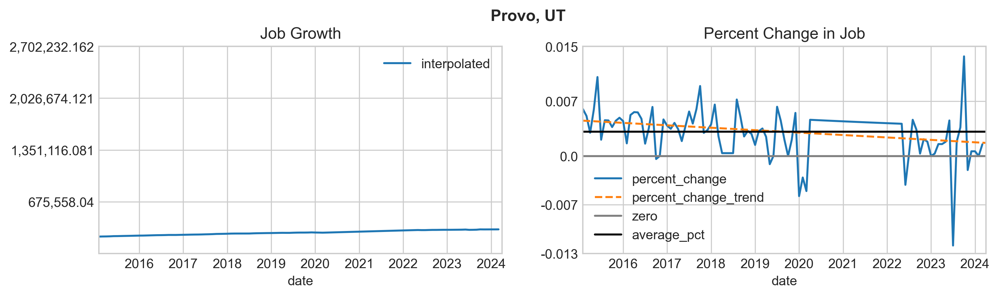

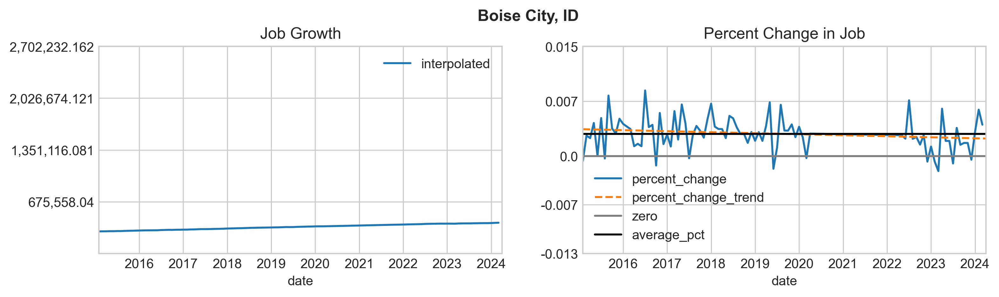

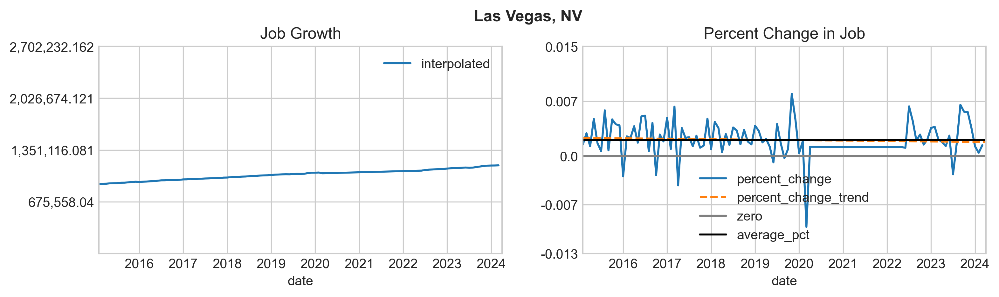

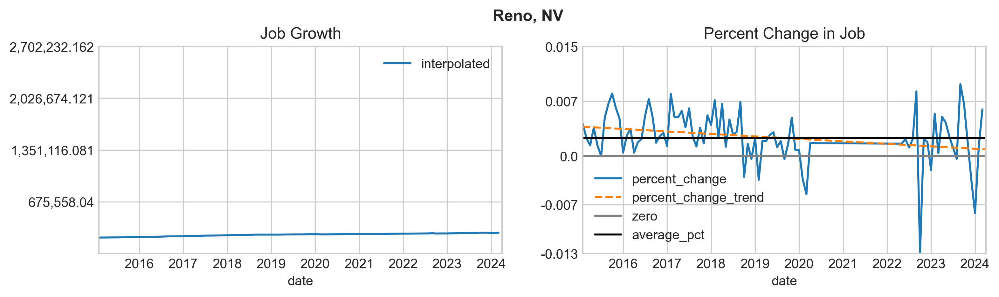

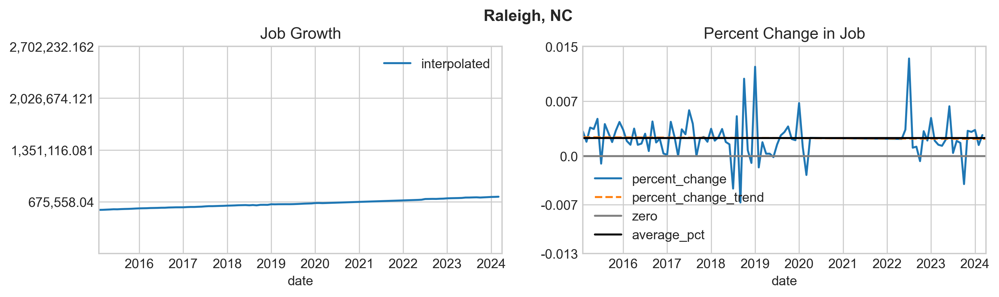

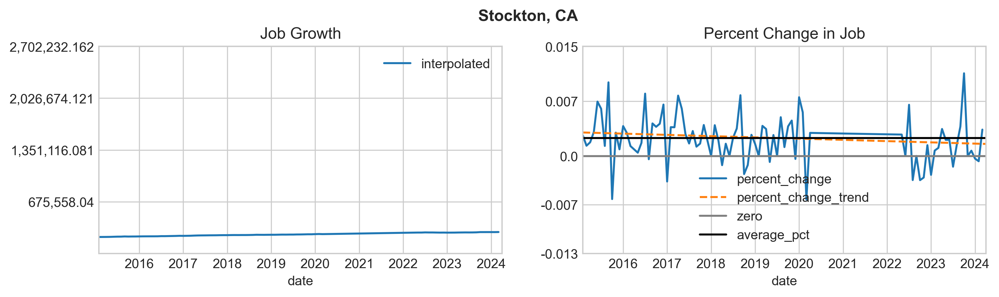

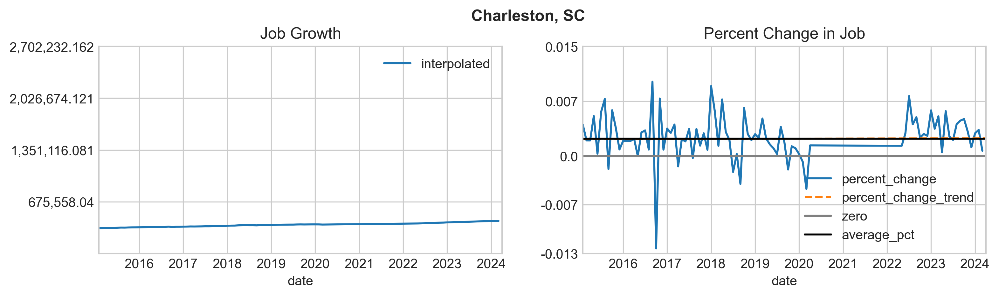

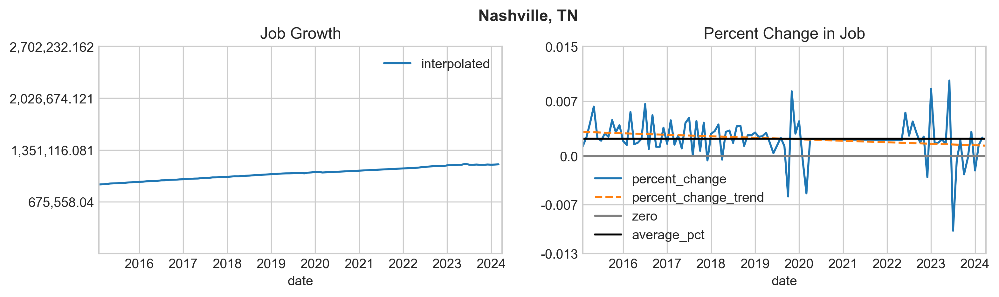

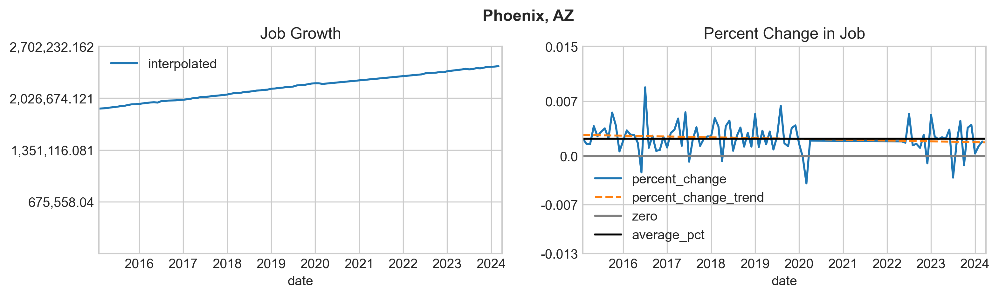

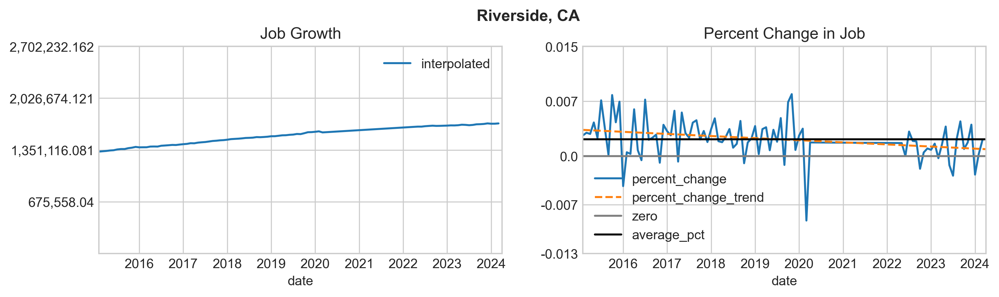

In [23]:
plot_top_10_cities(
    ranked_cities=rank_bls_jobs_avgpct_filtered.head(10),
    plot_jobs=True,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    begin_year_1=2015, 
    using_zillow_data=True,
    column_to_use='interpolated',
    plot_total_growth_trend=False
)


In [67]:
# Just filter for price
rank_zillow_price, filtered_rank_zillow_price = make_zillow_ranking(
    df_dict={
        "Median Price":[zillow_price, 2015],
    },
    use_total_trend=False,
    use_average_percent=True,
    average_percent_weight_dict={
        "Median Price":1
        
    }
)

filtered_rank_zillow_price.head(10)

,msa_name,trend_coef_Median Price,average_value_Median Price,pct_coef_Median Price,average_pct_Median Price,normalized_trend_coef_Median Price,normalized_pct_coef_Median Price,normalized_average_pct_Median Price,Median Price_weight,total_weight,avg_insurance,prop_tax,Jobs,Median Rent,Median Price,rent_price_ratio
21,"Boise City, ID",112.4428,2605.5449,-0.0000,0.0085,0.3924,0.2368,0.8234,0.8234,0.8234,3427.0000,0.0069,401000.0000,1767.2558,476277.3169,0.0037
41,"Spokane, WA",88.2031,2154.1706,-0.0000,0.0079,0.3159,0.3071,0.7806,0.7806,0.7806,2801.0000,0.0098,274400.0000,1511.3342,410051.4032,0.0037
51,"Ogden, UT",102.7123,2616.1500,-0.0000,0.0079,0.3617,0.3044,0.7757,0.7757,0.7757,2876.0000,0.0063,298500.0000,1696.3353,500609.2015,0.0034
73,"Nashville, TN",81.6813,2264.3769,-0.0000,0.0075,0.2954,0.3035,0.7481,0.7481,0.7481,4873.0000,0.0071,1163000.0000,1904.4591,446525.7677,0.0043
78,"Knoxville, TN",59.1870,1723.6784,0.0000,0.0075,0.2244,0.6702,0.7464,0.7464,0.7464,4873.0000,0.0071,439100.0000,1777.6762,340442.9026,0.0052
79,"Charlotte, NC",70.8589,1945.9526,0.0000,0.0075,0.2612,0.4606,0.7458,0.7458,0.7458,4375.0000,0.0084,1363200.0000,1771.2063,384642.9025,0.0046
82,"Atlanta, GA",71.3225,1957.0277,0.0000,0.0074,0.2627,0.4548,0.7422,0.7422,0.7422,4006.0000,0.0092,3078000.0000,1919.1852,388469.2970,0.0049
94,"Seattle, WA",141.4179,3893.3917,-0.0000,0.0073,0.4838,0.2161,0.7326,0.7326,0.7326,2801.0000,0.0098,2146400.0000,2193.7345,783020.2118,0.0028
98,"Salt Lake City, UT",109.2572,2787.2893,-0.0000,0.0073,0.3823,0.3088,0.7300,0.7300,0.7300,2876.0000,0.0063,826800.0000,1693.4367,561815.4033,0.0030
103,"Phoenix, AZ",91.2184,2320.7105,-0.0000,0.0072,0.3254,0.3970,0.7288,0.7288,0.7288,4086.0000,0.0066,2444200.0000,1864.0178,468841.5000,0.0040


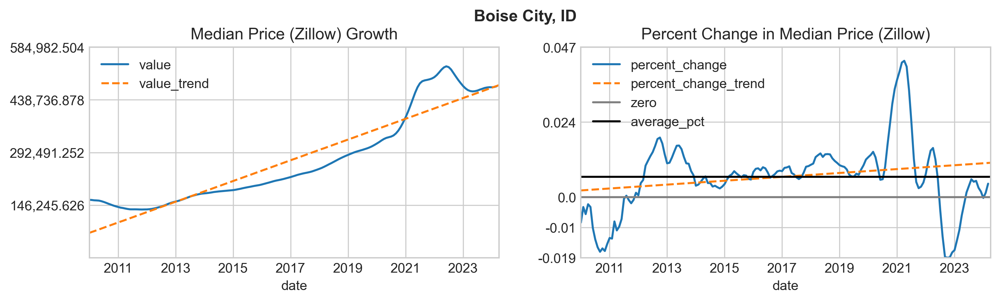

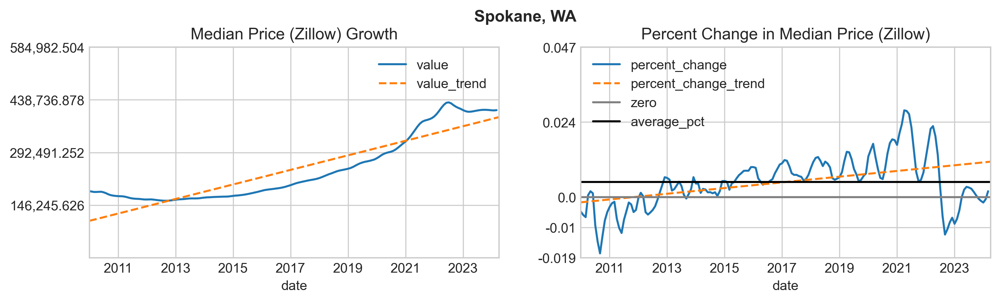

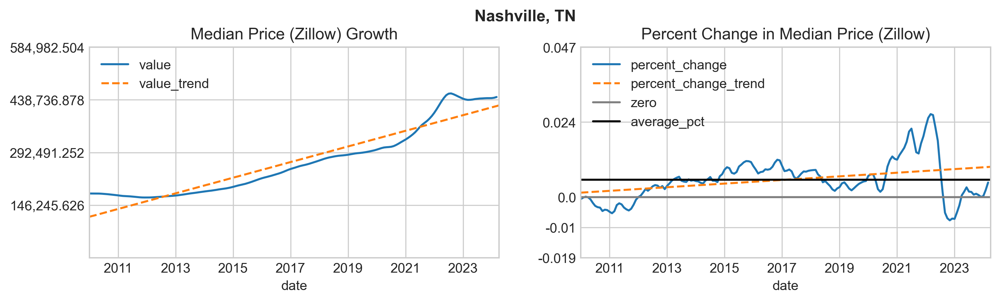

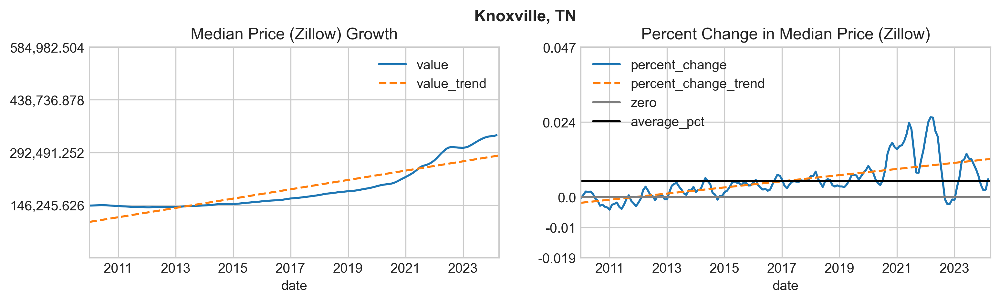

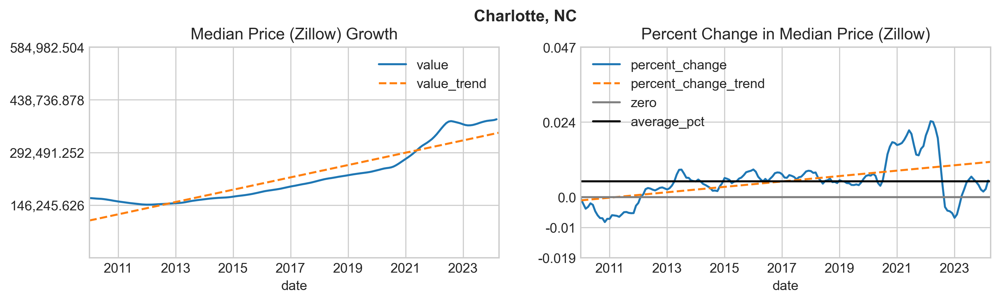

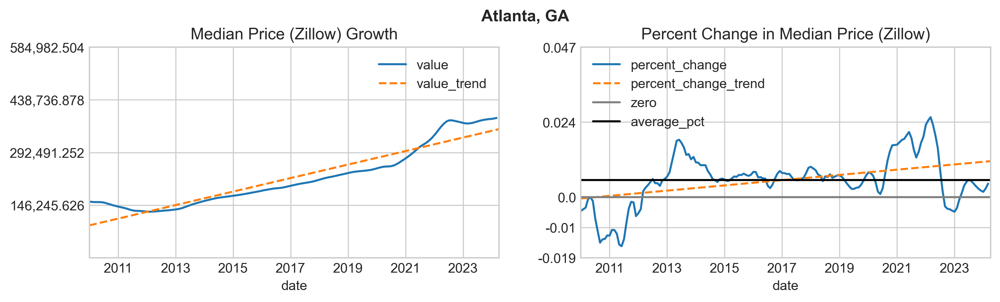

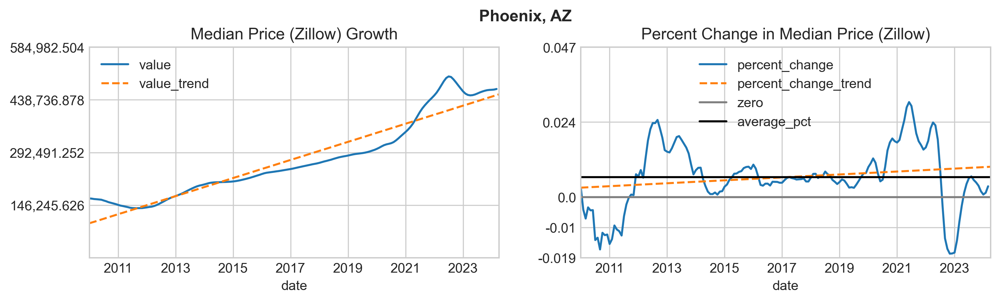

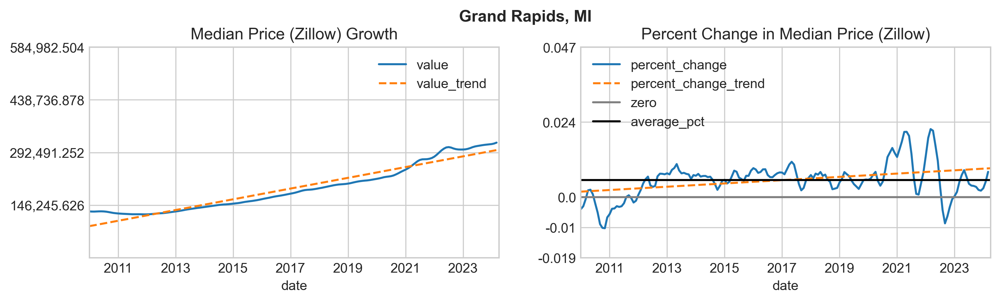

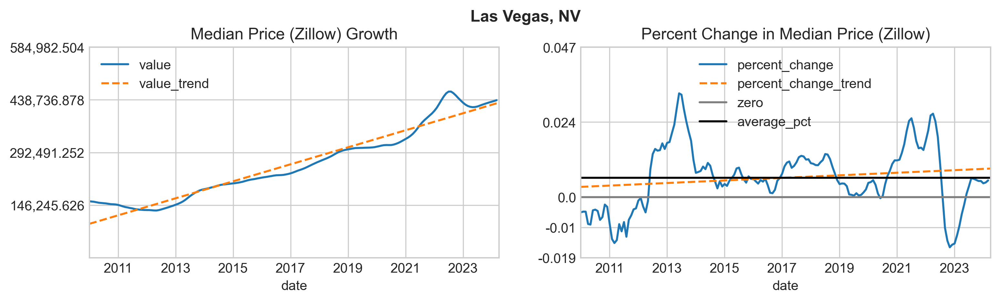

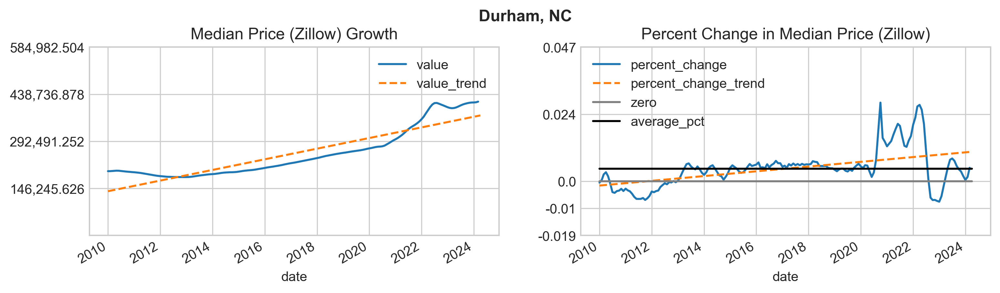

In [382]:
plot_top_10_cities(
    ranked_cities=filtered_rank_zillow_price,
    plot_jobs=False,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_zillow_price=True,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    begin_year_1=2010, 
    using_zillow_data=True
)

In [66]:
rank_zillow_job_price, filtered_rank_zillow_job_price = make_zillow_ranking(
    df_dict={
        "Jobs":[jobs_smooth, 2015],
        "Median Price":[zillow_price, 2015],
    },

    use_total_trend=False,
    use_average_percent=True,
    average_percent_weight_dict={
        "Jobs":1,
        "Median Price":1
        
    }
)

filtered_rank_zillow_job_price[[
    'msa_name','Jobs',
    'Median Rent','Median Price',
    'rent_price_ratio','avg_insurance','prop_tax'
]].head(10)

,msa_name,Jobs,Median Rent,Median Price,rent_price_ratio,avg_insurance,prop_tax
1,"Boise City, ID",401000.0000,1767.2558,476277.3169,0.0037,3427.0000,0.0069
5,"Provo, UT",314400.0000,1768.9060,546281.6691,0.0032,2876.0000,0.0063
13,"Nashville, TN",1163000.0000,1904.4591,446525.7677,0.0043,4873.0000,0.0071
15,"Ogden, UT",298500.0000,1696.3353,500609.2015,0.0034,2876.0000,0.0063
20,"Reno, NV",270100.0000,1873.8607,547226.3424,0.0034,2707.0000,0.0060
22,"Phoenix, AZ",2444200.0000,1864.0178,468841.5000,0.0040,4086.0000,0.0066
26,"Las Vegas, NV",1149800.0000,1772.9315,437748.8968,0.0041,2707.0000,0.0060
27,"Charlotte, NC",1363200.0000,1771.2063,384642.9025,0.0046,4375.0000,0.0084
33,"Spokane, WA",274400.0000,1511.3342,410051.4032,0.0037,2801.0000,0.0098
34,"Salt Lake City, UT",826800.0000,1693.4367,561815.4033,0.0030,2876.0000,0.0063


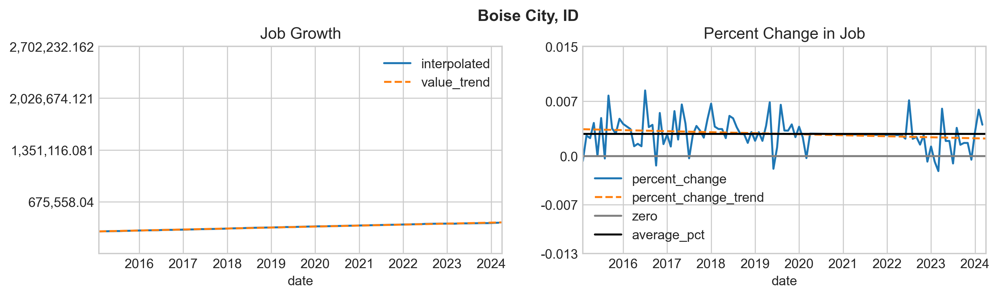

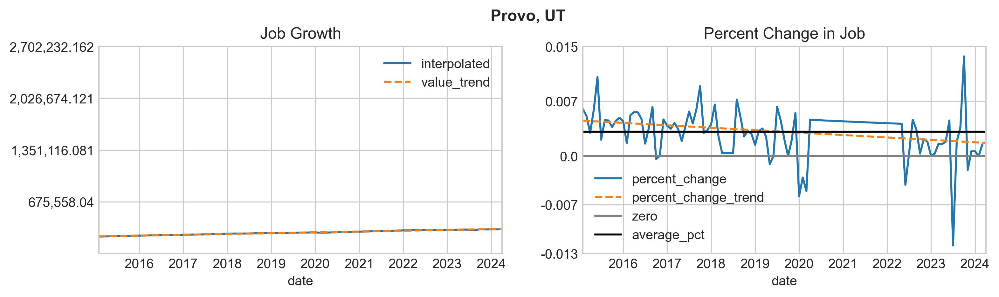

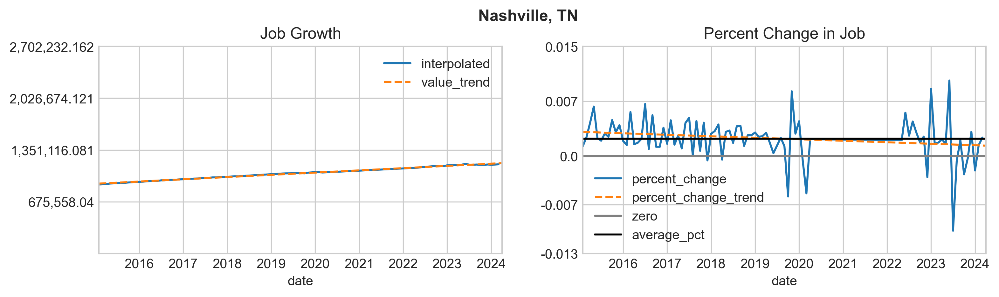

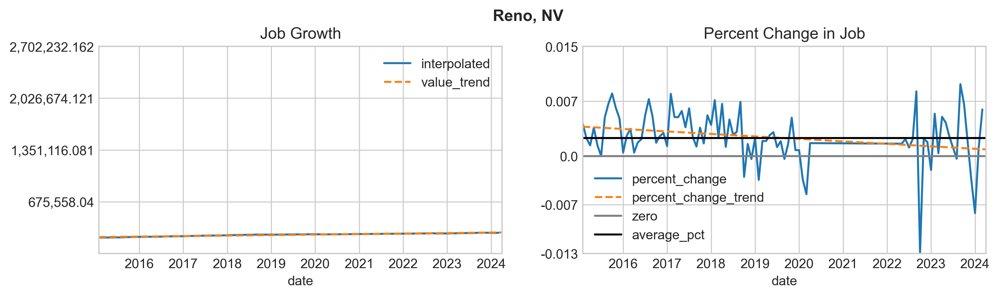

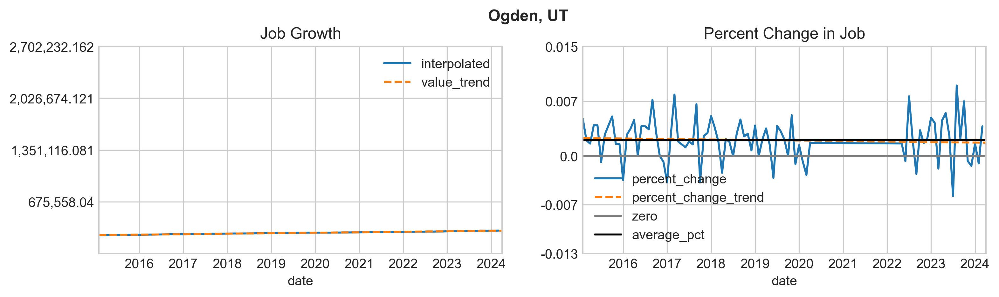

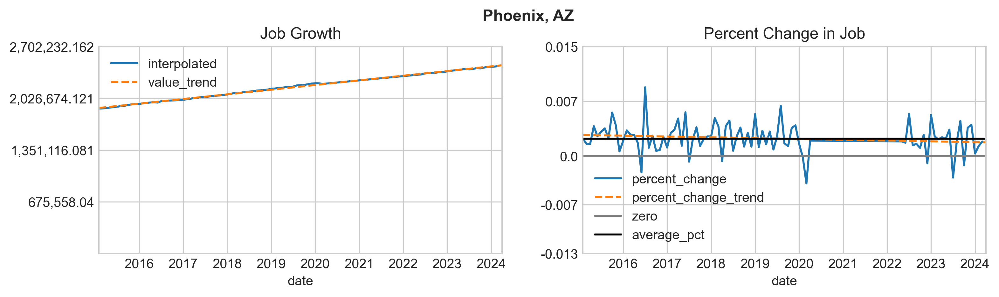

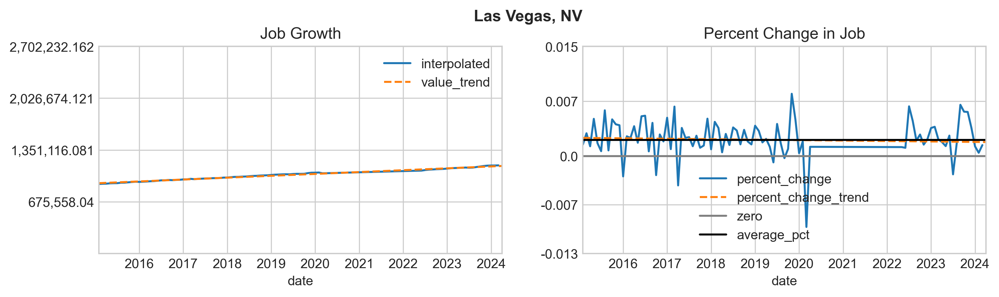

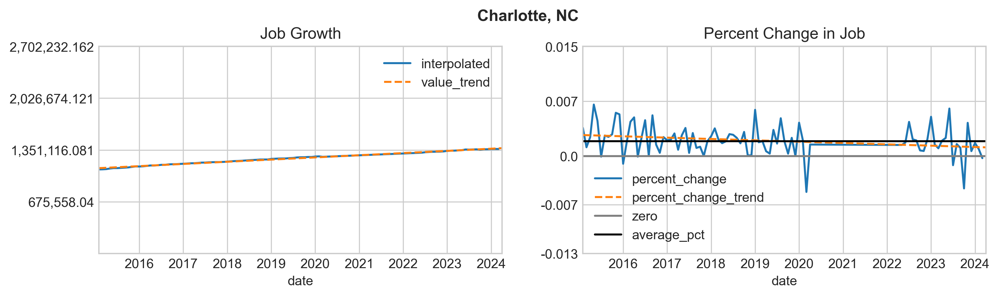

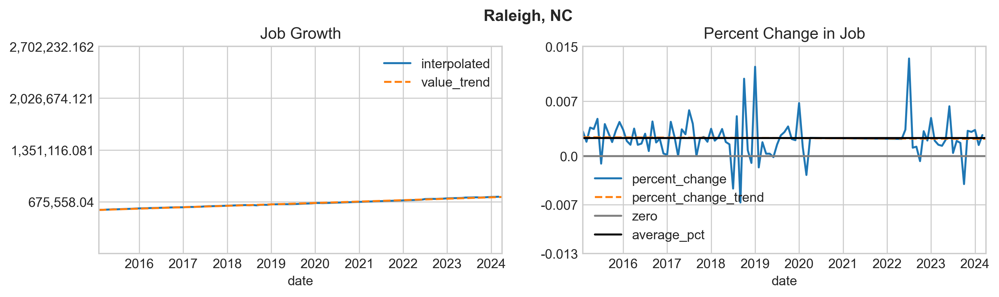

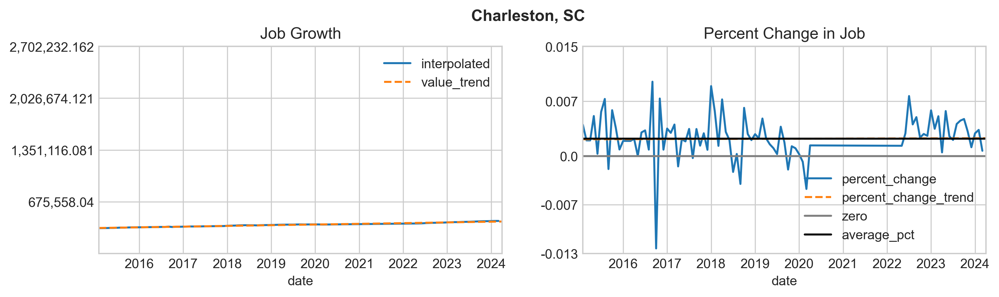

In [298]:
### Turn one of the plot_{demographics} to True,
### and leave the rest False to graph your demographic
plot_top_10_cities(
    ranked_cities=filtered_rank_zillow_job_price,
    plot_jobs=True,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    begin_year_1=2015, 
    using_zillow_data=True,
    column_to_use='interpolated'
)

In [65]:
# Get Job and Rent growth
rank_zillow_jobsrent, rank_zillow_jobsrent_filtered = make_zillow_ranking(
    df_dict={
        "Jobs":[jobs_250, 2015],
        "Median Rent":[zillow_rent, 2015],
    },
    use_total_trend=False,
    use_average_percent=True,
    average_percent_weight_dict={
        "Jobs":1,
        "Median Rent":1,        
    }
)

rank_zillow_jobsrent_filtered.head(20)

,msa_name,trend_coef_Jobs,average_value_Jobs,pct_coef_Jobs,average_pct_Jobs,trend_coef_Median Rent,average_value_Median Rent,pct_coef_Median Rent,average_pct_Median Rent,normalized_trend_coef_Jobs,normalized_pct_coef_Jobs,normalized_average_pct_Jobs,Jobs_weight,normalized_trend_coef_Median Rent,normalized_pct_coef_Median Rent,normalized_average_pct_Median Rent,Median Rent_weight,total_weight,avg_insurance,prop_tax,Jobs,Median Rent,Median Price,rent_price_ratio
0,"Boise City, ID",34.2047,1026.3636,-0.0000,0.0031,0.3070,7.9118,-0.0000,0.0062,0.1691,0.3542,0.9186,0.9186,0.7009,0.2804,0.8908,0.8908,1.8094,3427.0000,0.0069,401000.0000,1767.2558,476277.3169,0.0037
4,"Phoenix, AZ",156.8718,5077.2727,0.0000,0.0024,0.3199,8.2352,-0.0000,0.0061,0.6268,0.4550,0.7260,0.7260,0.7412,0.3520,0.8641,0.8641,1.5900,4086.0000,0.0066,2444200.0000,1864.0178,468841.5000,0.0040
5,"Reno, NV",16.9355,579.0909,-0.0000,0.0026,0.2910,8.0134,-0.0000,0.0058,0.1047,0.1387,0.7694,0.7694,0.6510,0.0000,0.8003,0.8003,1.5697,2707.0000,0.0060,270100.0000,1873.8607,547226.3424,0.0034
6,"Provo, UT",28.7452,869.0909,-0.0000,0.0033,0.2365,6.5615,0.0000,0.0048,0.1488,0.0000,0.9965,0.9965,0.4813,0.5465,0.5670,0.5670,1.5635,2876.0000,0.0063,314400.0000,1768.9060,546281.6691,0.0032
7,"Stockton, CA",18.8442,593.6364,-0.0000,0.0025,0.3527,10.1630,-0.0000,0.0059,0.1118,0.3712,0.7461,0.7461,0.8434,0.1929,0.8138,0.8138,1.5600,2598.0000,0.0076,279600.0000,2358.7800,546086.1455,0.0043
9,"Riverside, CA",105.0371,3374.5455,-0.0000,0.0024,0.3867,10.4860,0.0000,0.0056,0.4334,0.2225,0.7041,0.7041,0.9493,0.5044,0.7565,0.7565,1.4606,2598.0000,0.0076,1697100.0000,2510.6858,588582.8347,0.0043
10,"Charleston, SC",23.1389,874.5455,0.0000,0.0025,0.2677,8.4491,0.0000,0.0054,0.1279,0.6936,0.7394,0.7394,0.5784,0.8271,0.7145,0.7145,1.4539,4319.0000,0.0057,424600.0000,2072.1196,433992.4604,0.0048
12,"Las Vegas, NV",55.4702,2224.5455,0.0000,0.0026,0.2700,6.9821,0.0000,0.0052,0.2485,0.8601,0.7786,0.7786,0.5855,0.4043,0.6588,0.6588,1.4374,2707.0000,0.0060,1149800.0000,1772.9315,437748.8968,0.0041
13,"Ogden, UT",16.8774,564.5455,-0.0000,0.0022,0.2705,7.1864,0.0000,0.0057,0.1045,0.4206,0.6459,0.6459,0.5872,0.4431,0.7830,0.7830,1.4290,2876.0000,0.0063,298500.0000,1696.3353,500609.2015,0.0034
14,"Spokane, WA",10.3986,382.7273,0.0000,0.0016,0.2551,6.9368,-0.0000,0.0064,0.0803,0.5461,0.4766,0.4766,0.5393,0.3496,0.9447,0.9447,1.4213,2801.0000,0.0098,274400.0000,1511.3342,410051.4032,0.0037


In [26]:
# Rank MSAs by all 3 metrics
rank_zillow_all, filtered_rank_zillow_all = make_zillow_ranking(
    df_dict={
        "Jobs":[jobs_smooth, 2015],
        "Median Rent":[zillow_rent, 2015],
        "Median Price":[zillow_price, 2015],
    },
    use_total_trend=False,
    use_average_percent=True,
    total_trend_weight_dict={
#         "Jobs":1,
#         "Median Rent":0.5,
#         "Median Price":1
    },
    average_percent_weight_dict={
        "Jobs":2,
        "Median Rent":0.5,
        "Median Price":1
        
    }
)

filtered_rank_zillow_all[[
    'msa_name','Jobs',
    'Median Rent','Median Price',
    'rent_price_ratio'
]].head(10)

,msa_name,Jobs,Median Rent,Median Price,rent_price_ratio
1,"Boise City, ID",401000.00,1767.26,476277.32,0.00
3,"Provo, UT",314400.00,1768.91,546281.67,0.00
12,"Reno, NV",270100.00,1873.86,547226.34,0.00
17,"Phoenix, AZ",2444200.00,1864.02,468841.50,0.00
19,"Las Vegas, NV",1149800.00,1772.93,437748.90,0.00
20,"Ogden, UT",298500.00,1696.34,500609.20,0.00
21,"Nashville, TN",1163000.00,1904.46,446525.77,0.00
24,"Stockton, CA",279600.00,2358.78,546086.15,0.00
25,"Charleston, SC",424600.00,2072.12,433992.46,0.00
28,"Riverside, CA",1697100.00,2510.69,588582.83,0.00


In [11]:
# Rank MSAs by all 3 metrics
rank_zillow_test, _ = make_zillow_ranking(
    df_dict={
        "Jobs":[jobs_smooth, 2015],
        "Rent":[zillow_rent, 2015],
        "Price":[zillow_price, 2015],
    },
    use_total_trend=False,
    use_average_percent=True,
    total_trend_weight_dict={
#         "Jobs":1,
#         "Median Rent":0.5,
#         "Median Price":1
    },
    average_percent_weight_dict={
        "Jobs":2,
        "Rent":0.5,
        "Price":1
        
    }
)

rank_zillow_test.head(10)

,msa_name,trend_coef_Jobs,average_value_Jobs,pct_coef_Jobs,average_pct_Jobs,trend_coef_Rent,average_value_Rent,pct_coef_Rent,average_pct_Rent,trend_coef_Price,average_value_Price,pct_coef_Price,average_pct_Price,normalized_trend_coef_Jobs,normalized_pct_coef_Jobs,normalized_average_pct_Jobs,Jobs_weight,normalized_trend_coef_Rent,normalized_pct_coef_Rent,normalized_average_pct_Rent,Rent_weight,normalized_trend_coef_Price,normalized_pct_coef_Price,normalized_average_pct_Price,Price_weight,total_weight,avg_insurance,prop_tax,Jobs,Median Rent,Median Price,rent_price_ratio
0,"St. George, UT",8.99,271.82,-0.00,0.00,0.26,6.92,-0.00,0.00,107.69,2676.96,-0.00,0.01,0.08,0.16,1.00,2.00,0.46,0.23,0.48,0.24,0.42,0.31,0.84,0.84,3.08,2876.00,0.01,86000.00,1807.46,530832.64,0.00
1,"Boise City, ID",34.20,1026.36,-0.00,0.00,0.31,7.91,-0.00,0.01,111.95,2609.96,-0.00,0.01,0.17,0.30,0.80,1.59,0.56,0.25,0.64,0.32,0.44,0.13,0.97,0.97,2.89,3427.00,0.01,401000.00,1767.26,479768.36,0.00
2,"Idaho Falls, ID",6.80,206.36,-0.00,0.00,0.21,5.45,0.00,0.01,88.12,2090.65,-0.00,0.01,0.07,0.37,0.77,1.54,0.36,0.51,0.65,0.33,0.34,0.22,0.95,0.95,2.81,3427.00,0.01,82800.00,1208.57,389177.51,0.00
3,"Provo, UT",28.75,869.09,-0.00,0.00,0.24,6.56,0.00,0.00,103.50,2615.84,-0.00,0.01,0.15,0.00,0.86,1.71,0.41,0.48,0.45,0.23,0.41,0.19,0.79,0.79,2.73,2876.00,0.01,314400.00,1768.91,534679.74,0.00
4,"Lakeland, FL",22.06,650.00,0.00,0.00,0.29,8.01,0.00,0.01,62.25,1662.14,0.00,0.01,0.12,0.38,0.73,1.45,0.53,0.49,0.57,0.28,0.23,0.37,0.91,0.91,2.64,5854.00,0.01,276200.00,1910.05,316290.91,0.01
5,"Port St. Lucie, FL",10.82,353.64,-0.00,0.00,0.41,11.20,0.00,0.01,78.13,2227.80,-0.00,0.01,0.08,0.36,0.65,1.30,0.77,0.53,0.69,0.35,0.30,0.29,1.00,1.00,2.64,5854.00,0.01,173700.00,2400.26,402978.51,0.01
6,"Bend, OR",5.61,210.91,-0.00,0.00,0.36,9.79,-0.00,0.01,129.34,3399.83,-0.00,0.01,0.06,0.02,0.72,1.44,0.66,0.24,0.60,0.30,0.52,0.22,0.84,0.84,2.58,3016.00,0.01,95000.00,2262.36,676139.19,0.00
7,"Gainesville, GA",7.01,255.45,0.00,0.00,0.28,7.72,-0.00,0.01,67.62,1915.99,0.00,0.01,0.07,0.54,0.72,1.45,0.49,0.31,0.61,0.30,0.25,0.49,0.82,0.82,2.58,4006.00,0.01,109900.00,1779.34,382978.94,0.00
8,"Naples, FL",10.65,374.55,0.00,0.00,0.49,13.45,0.00,0.01,97.39,2902.61,0.00,0.01,0.08,0.40,0.72,1.43,0.94,0.75,0.70,0.35,0.38,0.63,0.74,0.74,2.52,5854.00,0.01,173900.00,2869.02,618052.99,0.00
9,"Palm Bay, FL",16.17,501.82,-0.00,0.00,0.32,9.15,-0.00,0.01,68.15,1900.32,-0.00,0.01,0.10,0.26,0.62,1.24,0.59,0.33,0.65,0.33,0.26,0.26,0.92,0.92,2.48,5854.00,0.01,255800.00,2020.61,359113.97,0.01


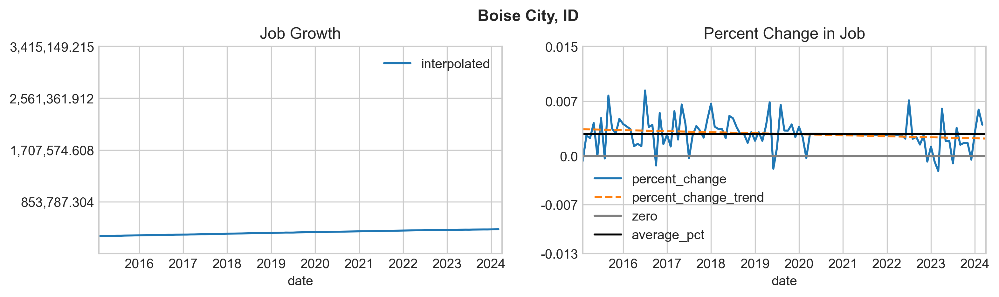

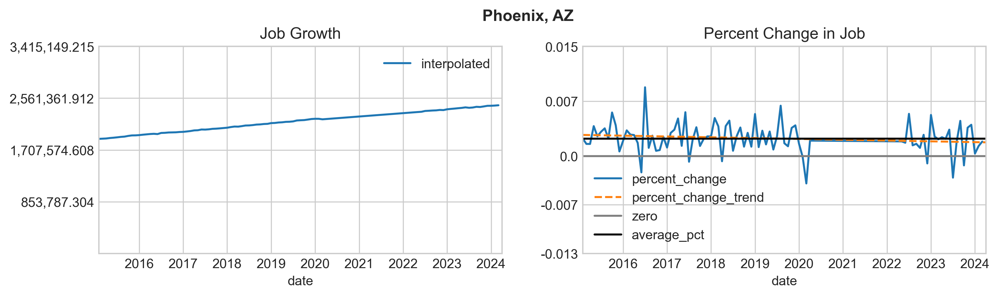

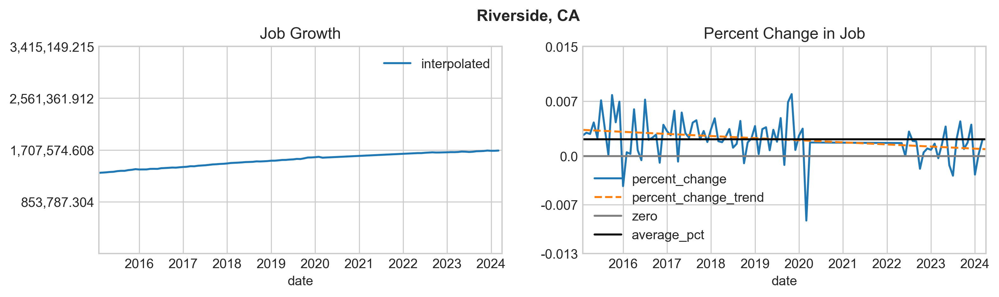

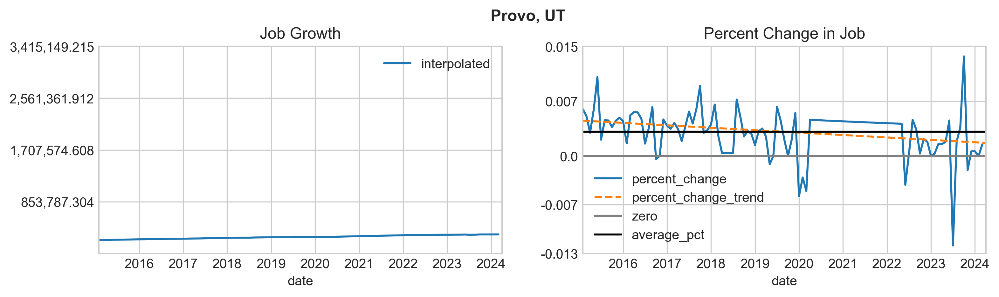

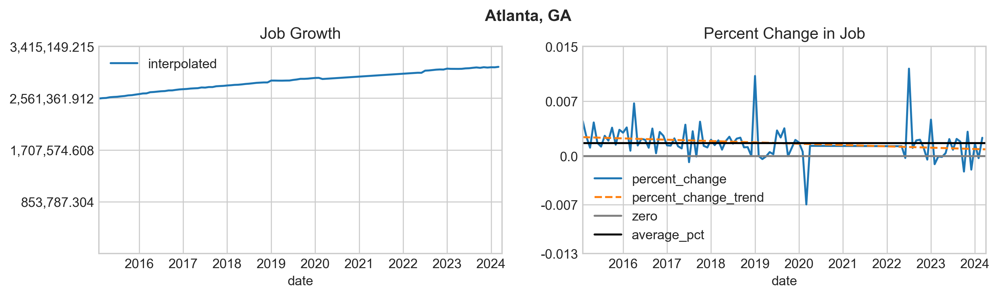

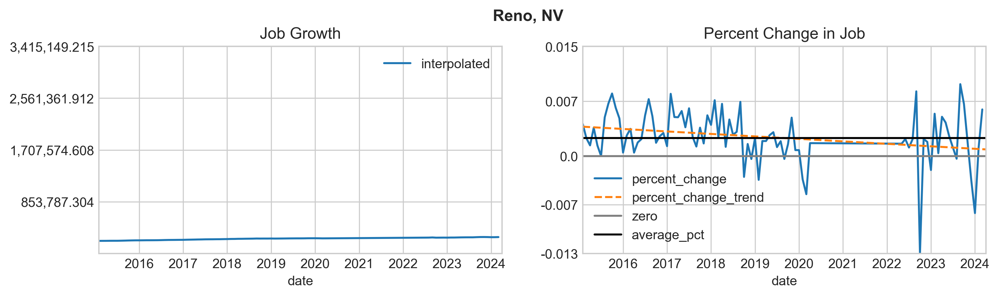

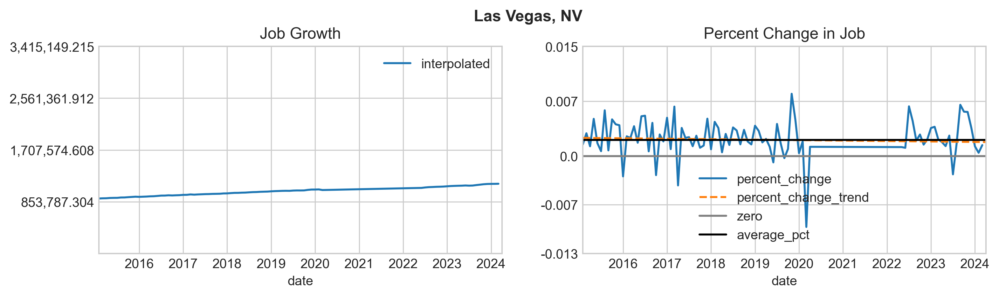

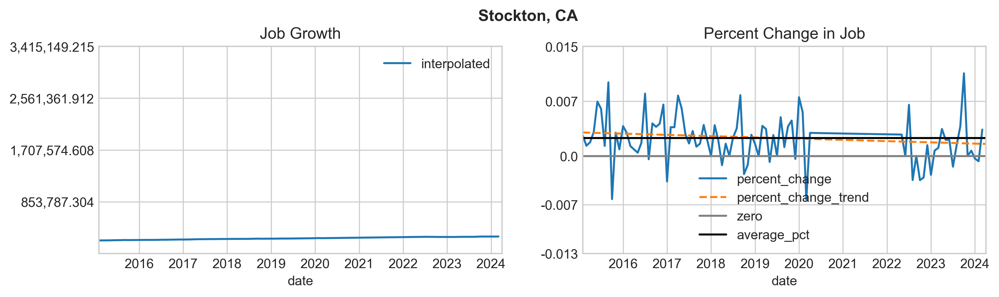

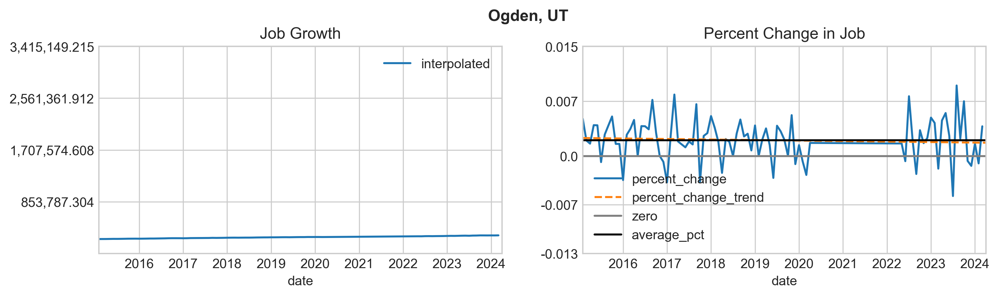

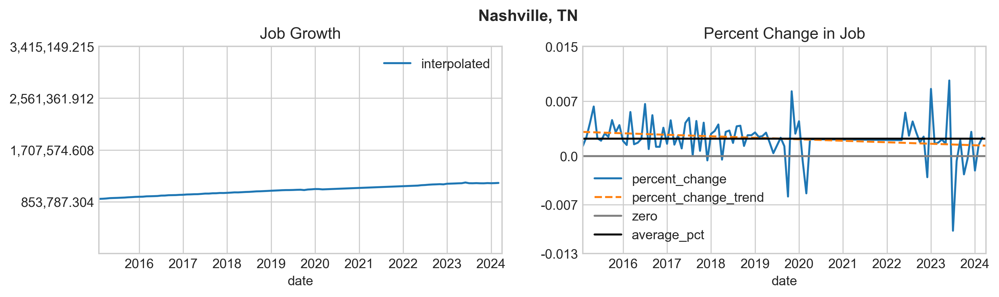

In [576]:
### Turn one of the plot_{demographics} to True,
### and leave the rest False to graph your demographic
plot_top_10_cities(
    ranked_cities=filtered_rank_zillow_all,
    plot_jobs=True,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    begin_year_1=2015, 
    using_zillow_data=True,
    column_to_use='interpolated',
    plot_total_growth_trend=False
)

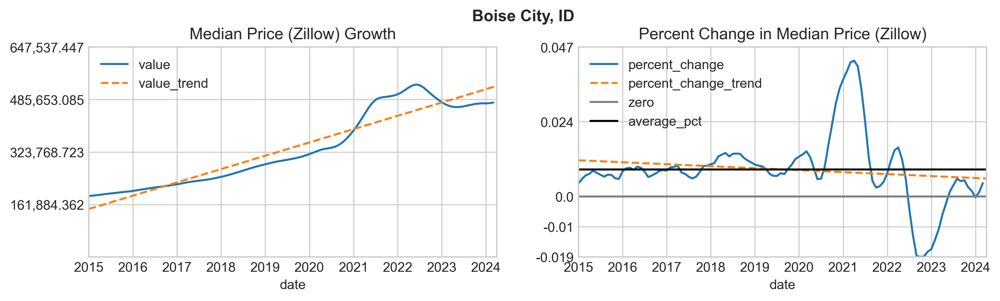

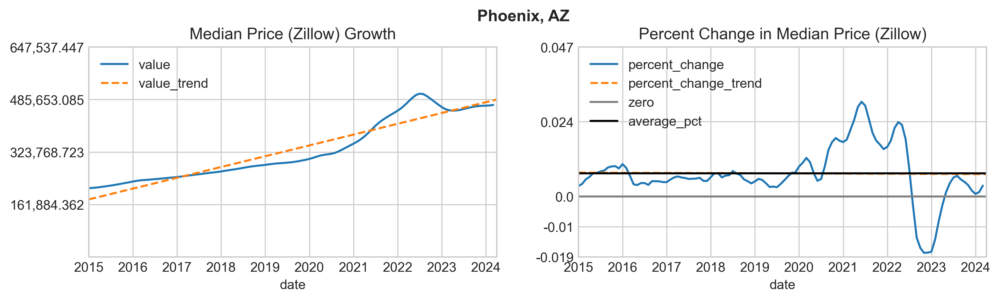

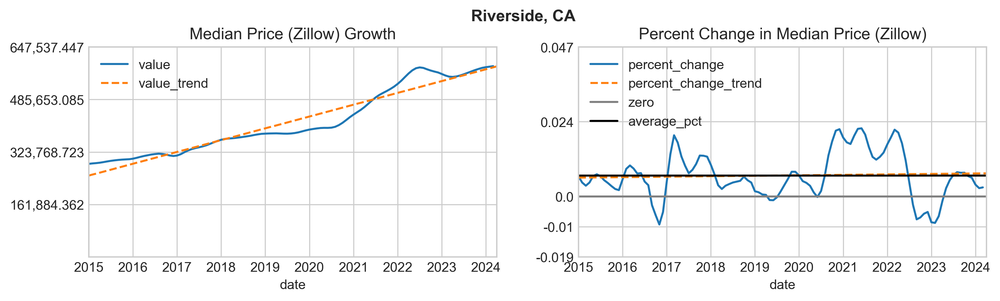

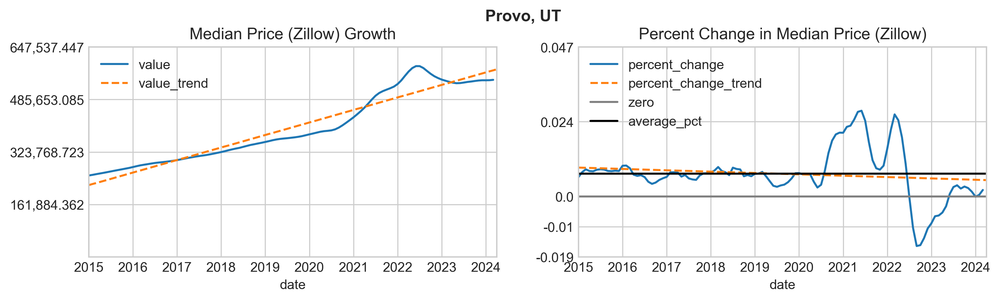

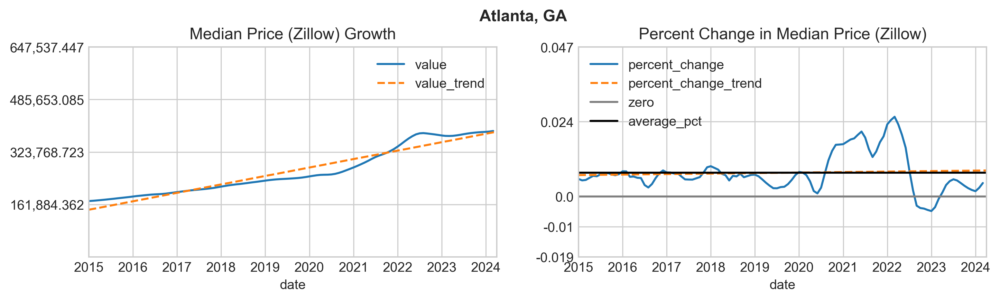

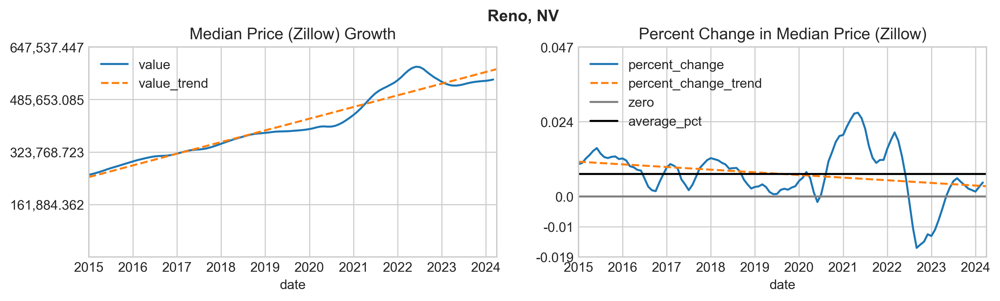

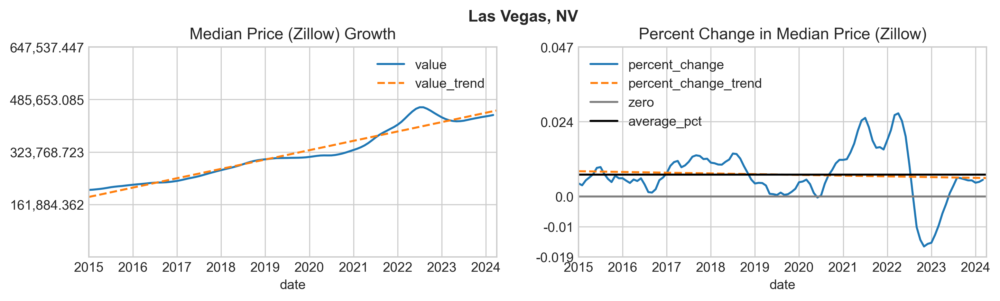

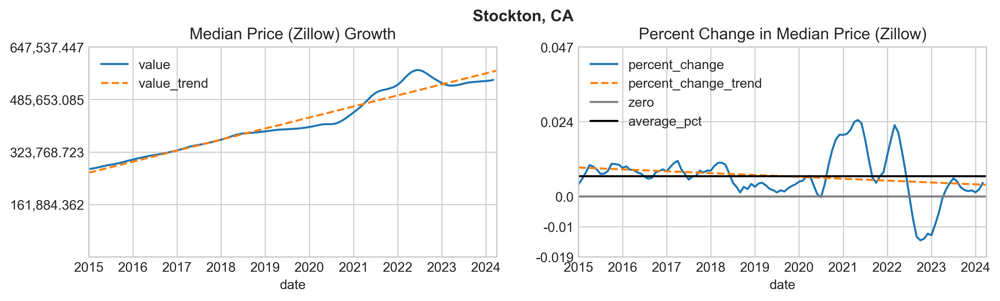

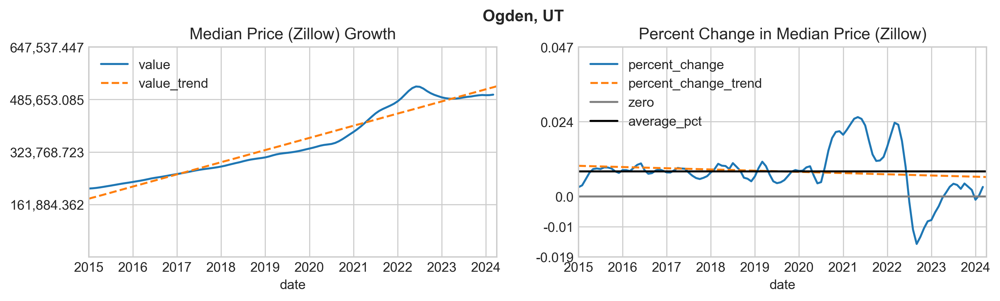

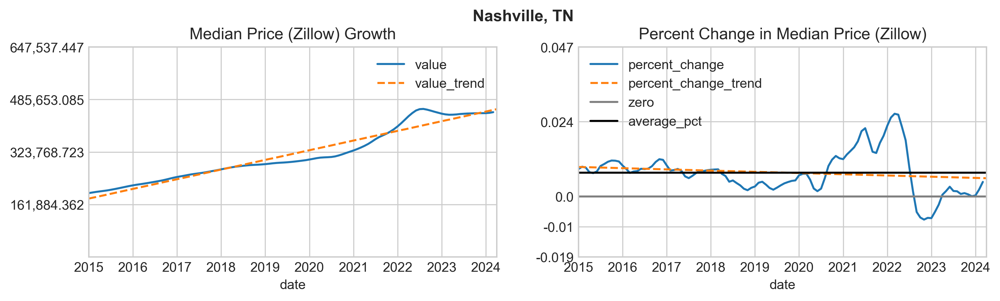

In [577]:
### Turn one of the plot_{demographics} to True,
### and leave the rest False to graph your demographic
plot_top_10_cities(
    ranked_cities=filtered_rank_zillow_all,
    plot_jobs=False,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    begin_year_1=2015, 
    using_zillow_data=True,
    plot_zillow_price=True,
    plot_zillow_rent=False,
    column_to_use='value'
)

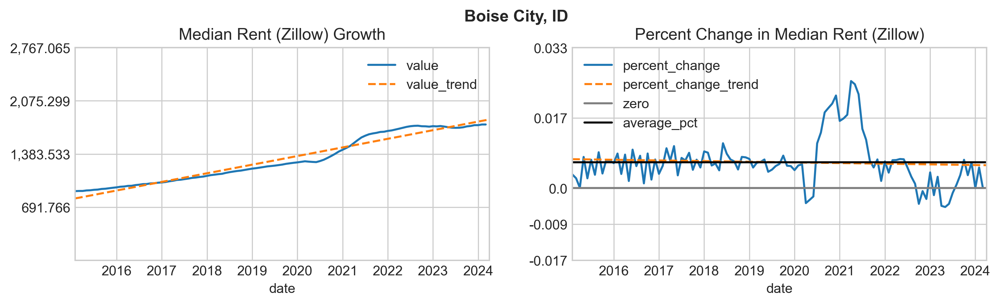

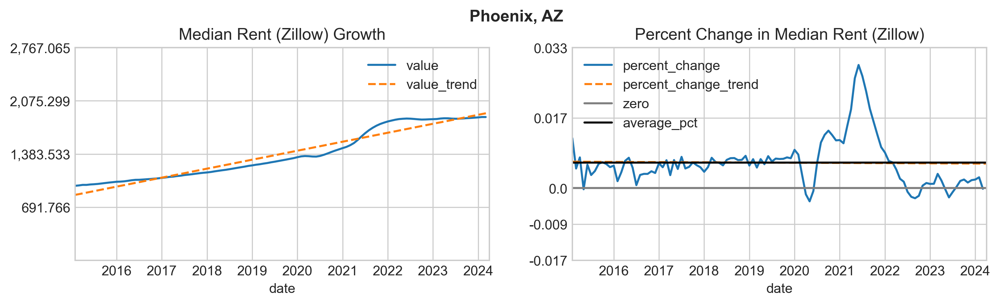

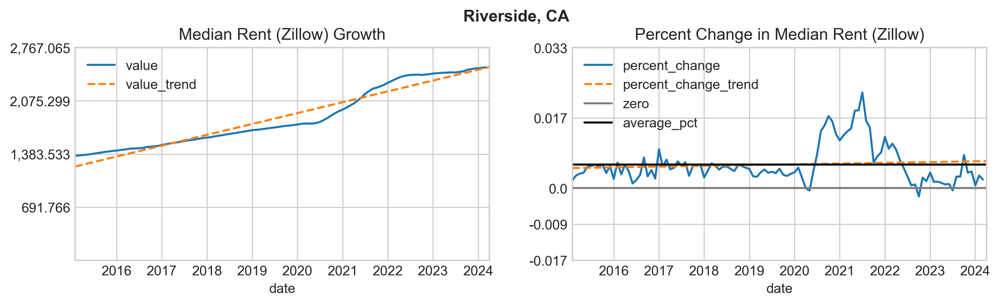

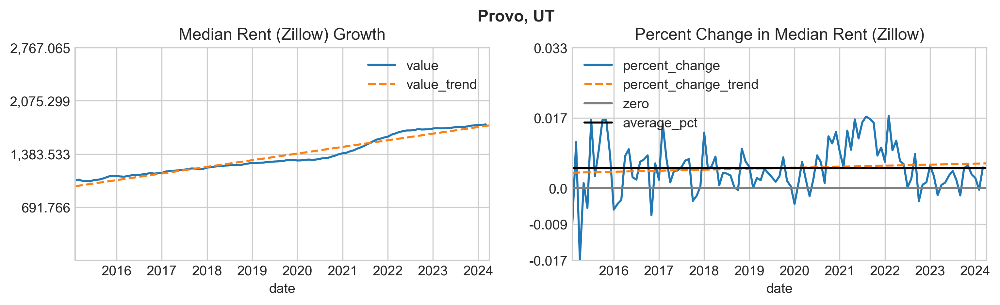

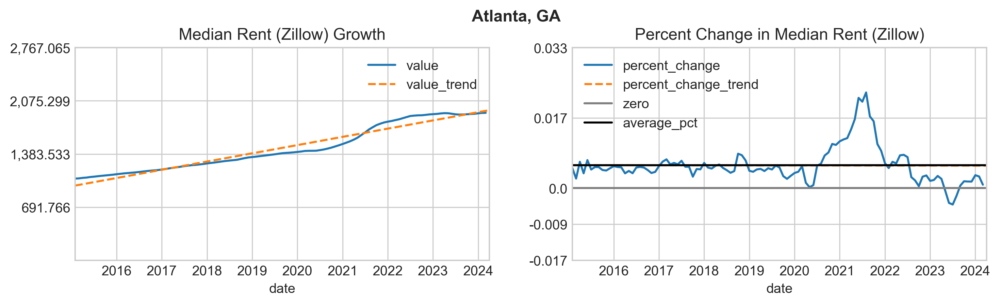

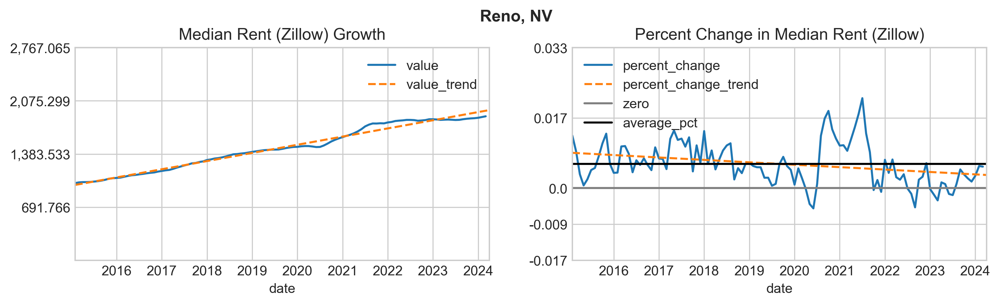

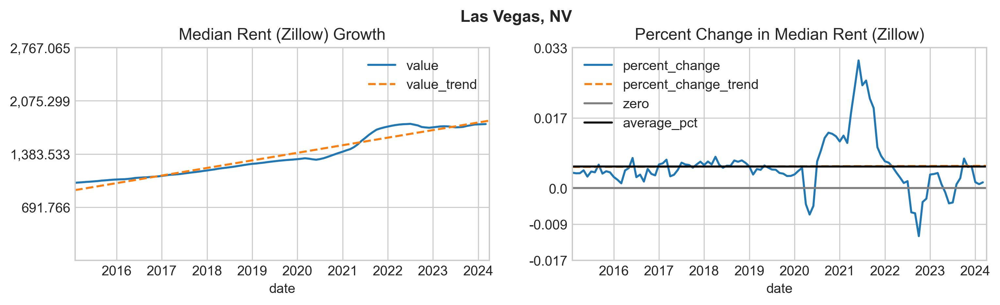

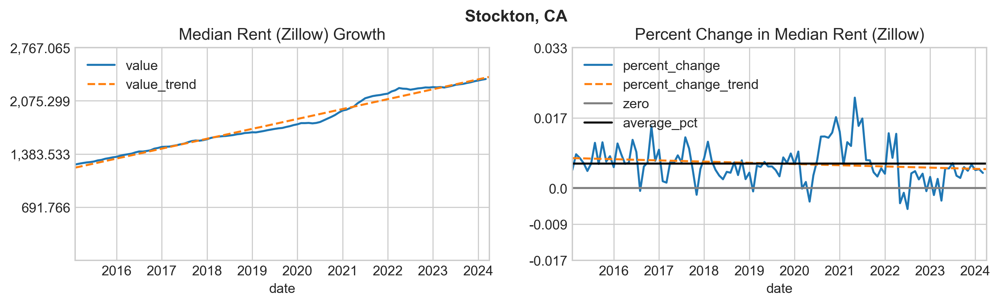

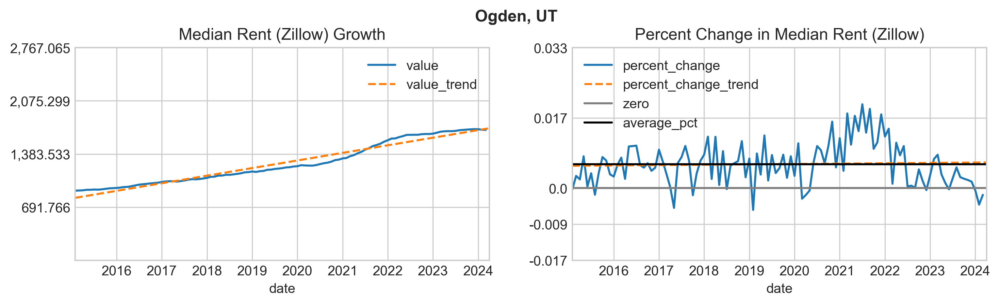

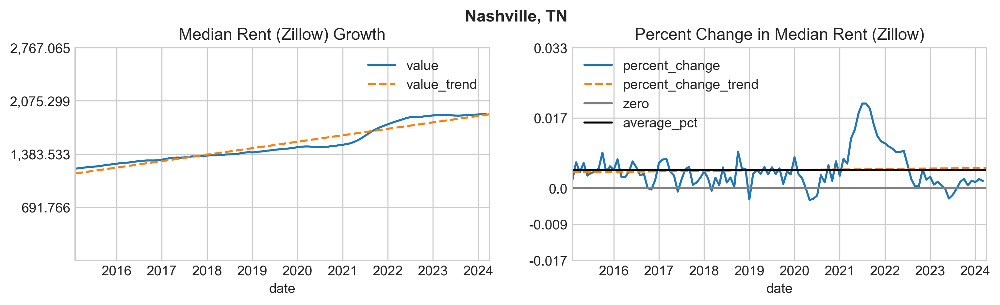

In [578]:
### Turn one of the plot_{demographics} to True,
### and leave the rest False to graph your demographic
plot_top_10_cities(
    ranked_cities=filtered_rank_zillow_all,
    plot_jobs=False,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    begin_year_1=2015, 
    using_zillow_data=True,
    plot_zillow_price=False,
    plot_zillow_rent=True,
    column_to_use='value'
)

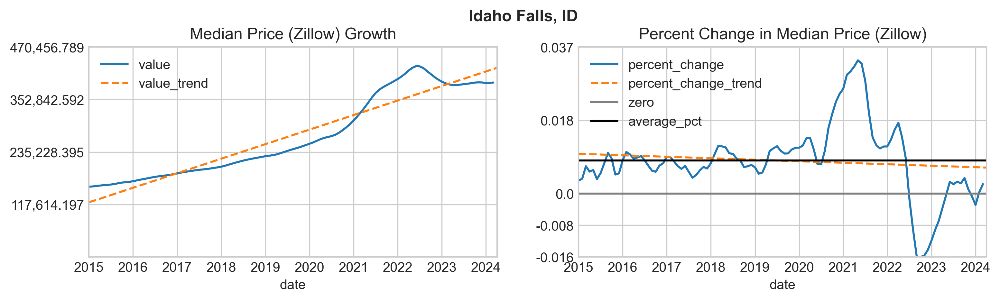

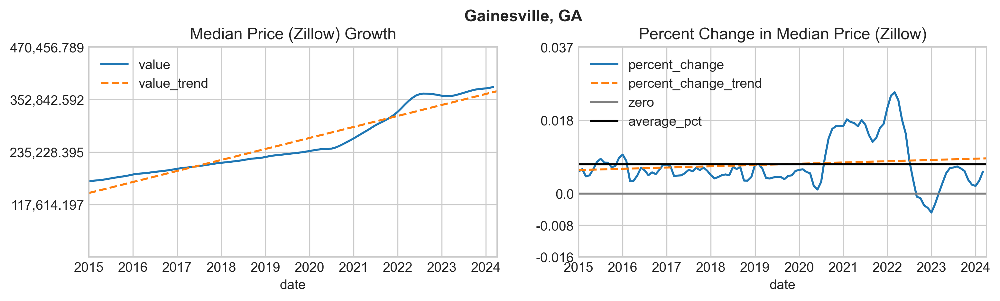

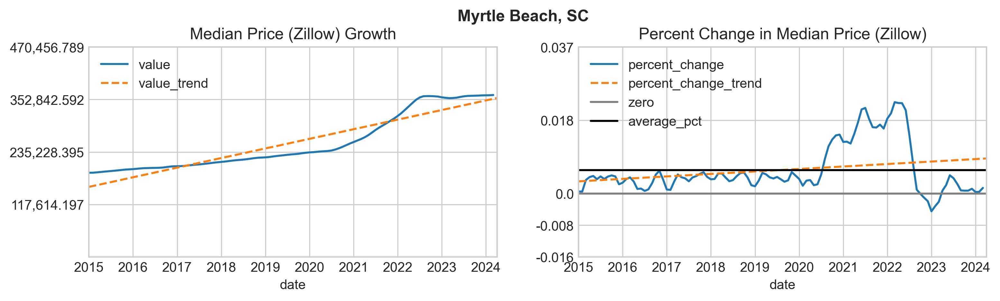

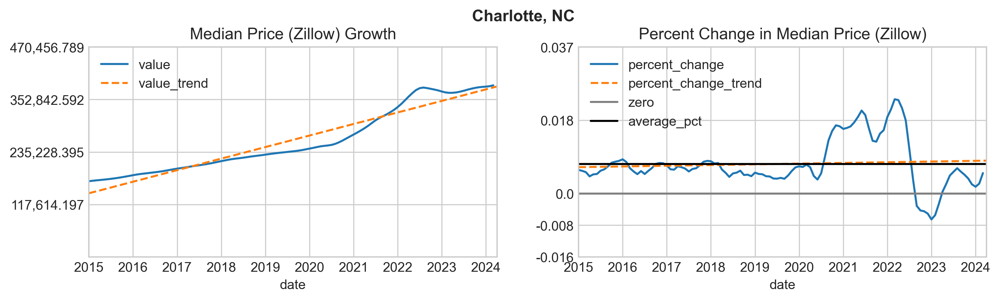

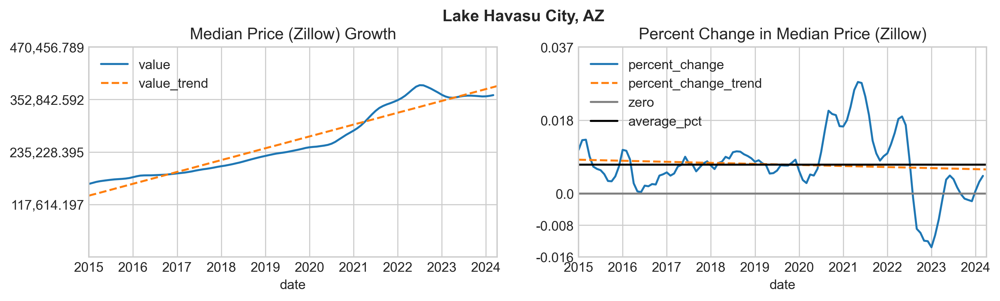

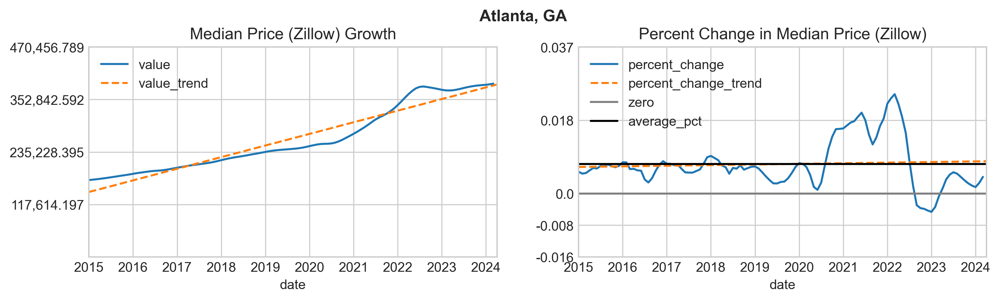

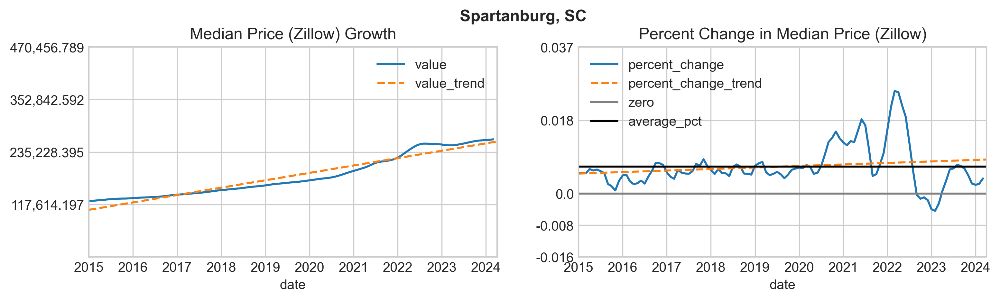

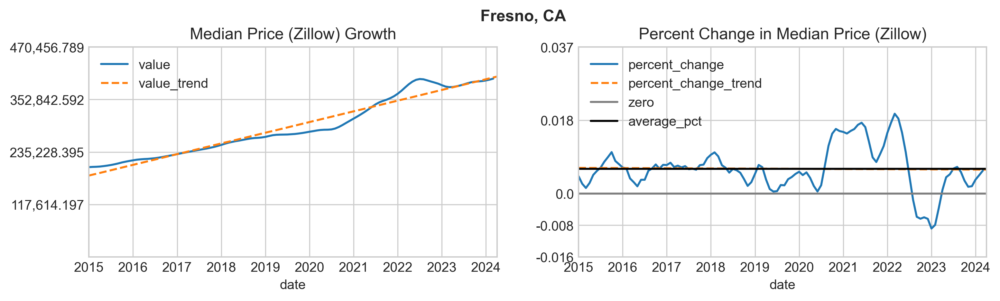

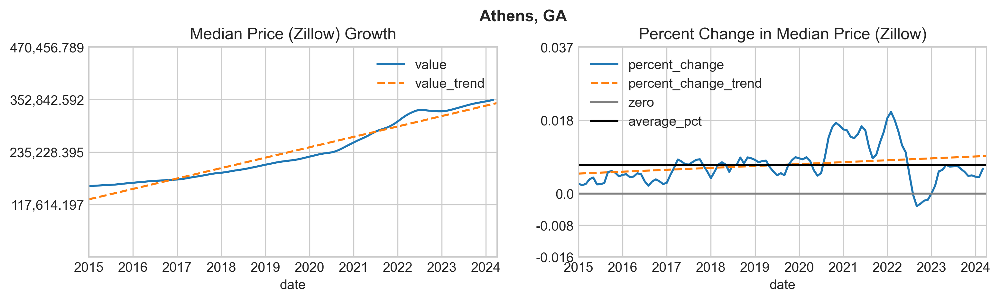

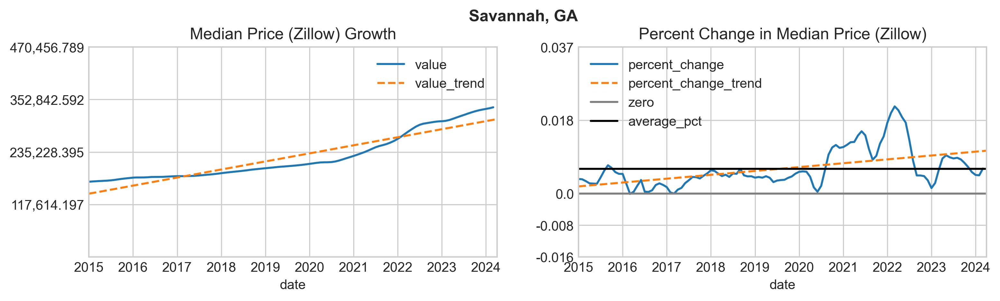

In [33]:
rank_zillow_all[
    (rank_zillow_all['Median Price']<=400_000)
    & (rank_zillow_all['avg_insurance']<=insurance_third_quantile)
    & (rank_zillow_all['prop_tax']<=proptaxes_third_quantile)
].head(10)


plot_top_10_cities(
    ranked_cities=rank_zillow_all[
    (rank_zillow_all['Median Price']<=400_000)
    & (rank_zillow_all['avg_insurance']<=insurance_third_quantile)
    & (rank_zillow_all['prop_tax']<=proptaxes_third_quantile)
].head(10),
    plot_jobs=False,
    plot_rent=False,
    plot_income=False,
    plot_price=False,
    plot_units=False,
    plot_rent_to_price=False,
    plot_jobs_per_unit=False,
    begin_year_1=2015, 
    using_zillow_data=True,
    plot_zillow_price=True,
    plot_zillow_rent=False,
    column_to_use='value'
)